# Test Notebook for developments of proper steering for nifty+maria

2024-12-04 17:45:24.486 INFO: Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
2024-12-04 17:45:24.488 INFO: Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory


Initialising...


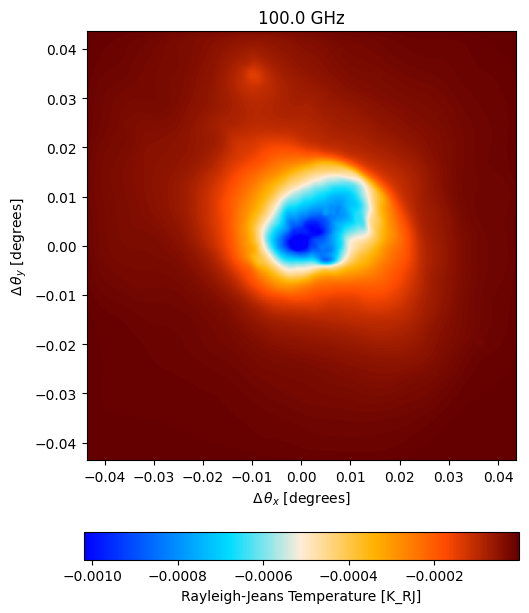

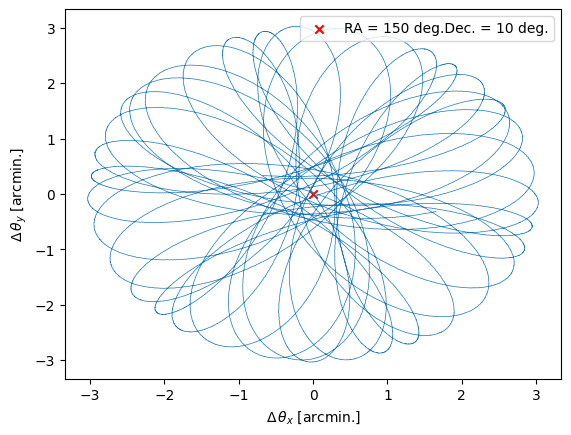

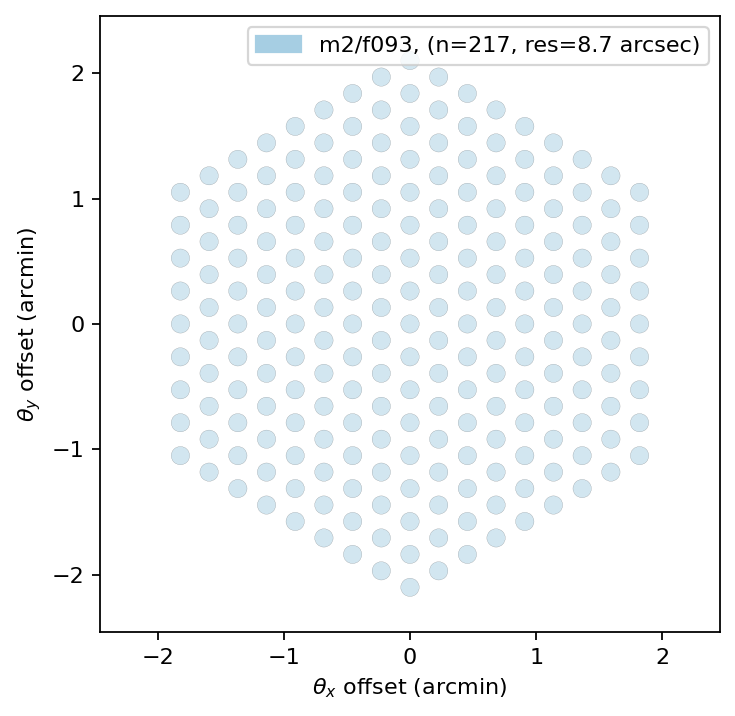

In [1]:
from nifty_maria.FitHandler import FitHandler

fit = FitHandler(config='mustang', fit_atmos=True, fit_map=True)

In [2]:
fit.simulate()

2024-12-04 17:45:27.063 INFO: Initialized base in 1757 ms.
Building atmosphere: 100%|██████████| 6/6 [00:04<00:00,  1.23it/s]
2024-12-04 17:45:33.500 INFO: Initialized atmosphere in 6420 ms.
Generating noise: 100%|██████████| 1/1 [00:00<00:00,  2.05it/s]


Running mapper (m2/f093): 100%|██████████| 1/1 [00:09<00:00,  9.48s/it]


mapdata_truth shape: (1, 1, 1000, 1000)
mapdata_truth mean: -8.726028151723567e-05


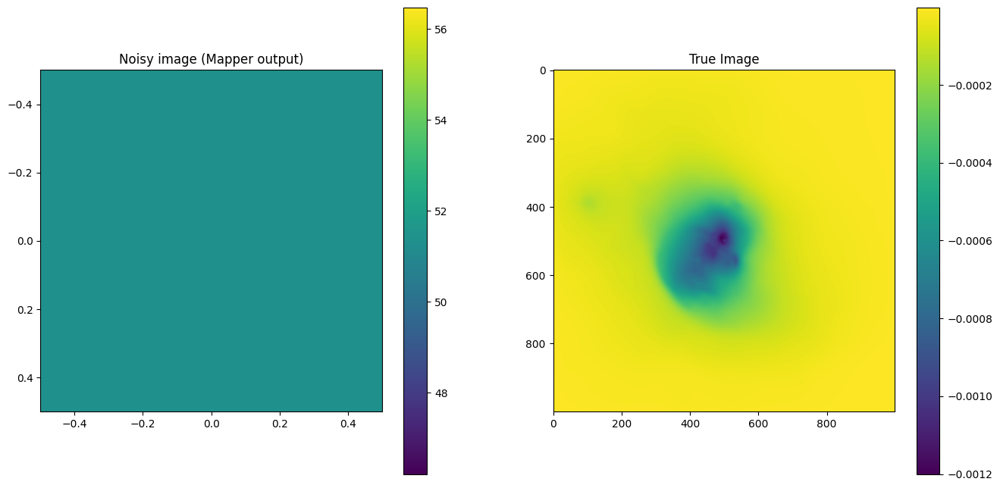

Running mapper (m2/f093): 100%|██████████| 1/1 [00:22<00:00, 22.17s/it]


In [3]:
fit.reco_maria()

# JAX

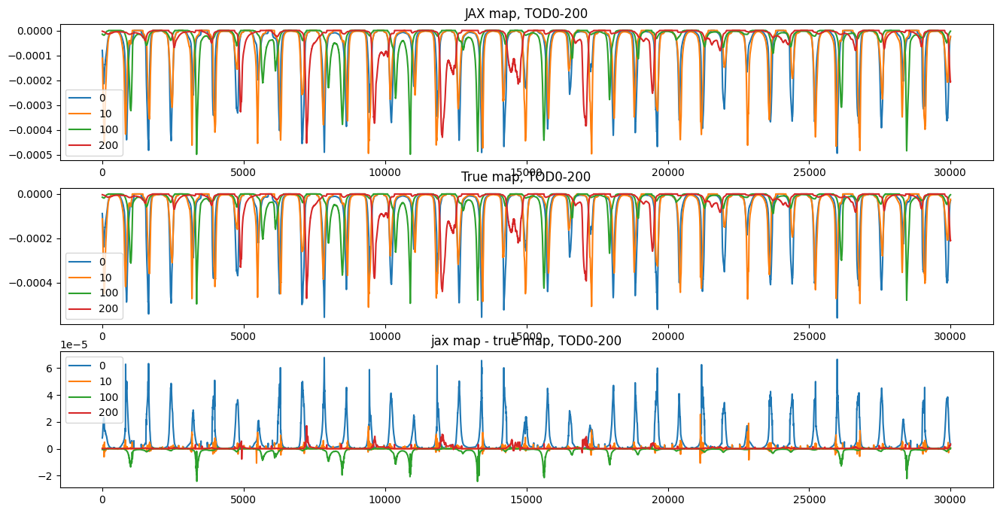

Noise stddev: 0.0002513729126660155


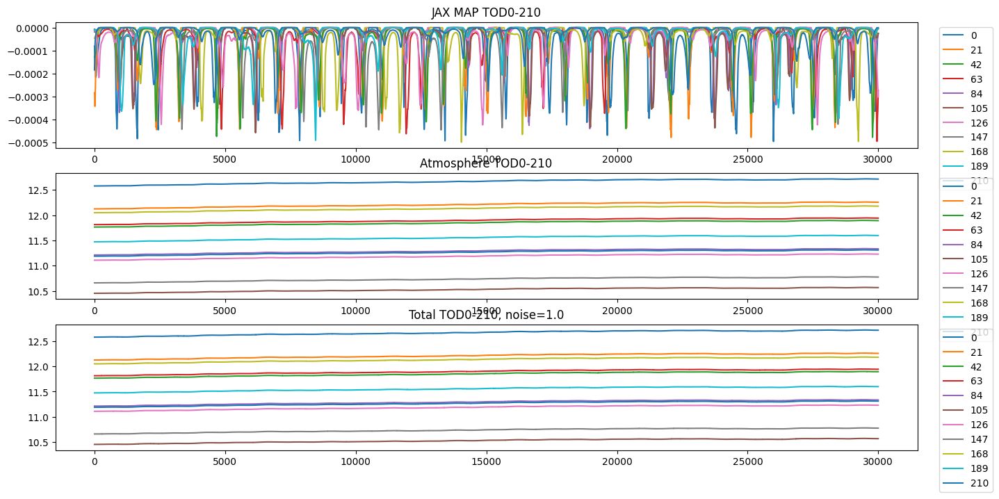

In [4]:
fit.sample_jax_tods(use_truth_slope=True)

In [5]:
fit.init_gps()

(2, 217)
Initialised gp_tod: Model(
	<function CFM.finalize.<locals>.correlated_field at 0x14d0e0101a80>,
	domain={'combcf tod fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf tod loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf xi': ShapeWithDtype(shape=(1, 40000), dtype=<class 'jax.numpy.float64'>),
	 'combcf zeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)},
	init=Initializer(
		{'combcf tod fluctuations': functools.partial(<function random_like at 0x14d12aa023e0>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'combcf tod loglogavgslope': functools.partial(<function random_like at 0x14d12aa023e0>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'combcf xi': functools.partial(<function random_like at 0x14d12aa023e0>, primals=ShapeWithDtype(shape=(1, 40000), dtype=<class 'jax.numpy.float64'>)),
		 'combcf zeromode': functools.partial(<fu

assuming a diagonal covariance matrix;
setting `std_inv` to `cov_inv(ones_like(data))**0.5`


noise_cov_inv_tod <function FitHandler.__init__.<locals>.<lambda> at 0x14d11811fd80>
Initialising model: Signal_TOD_combined_nomappadding


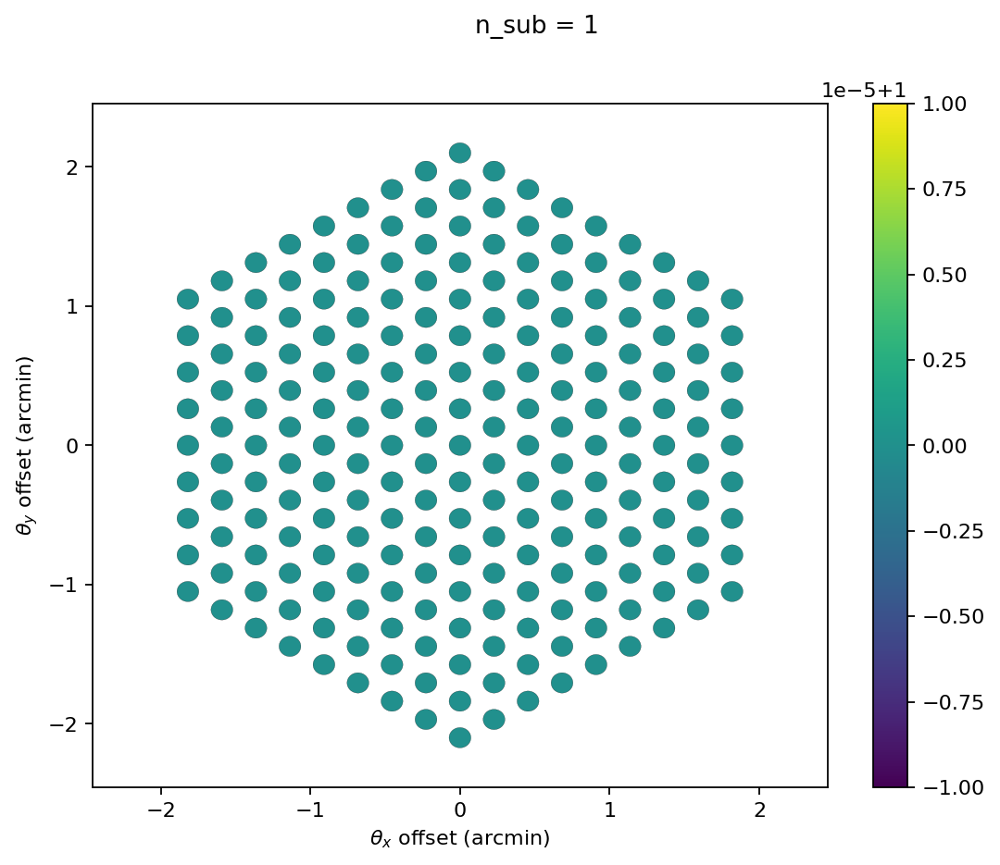

In [6]:
fit.plot_subdets()

(217, 30000)


Array([[12.66575264, 12.66575554, 12.66576121, ..., 12.66642198,
        12.66641399, 12.66641375],
       [10.79521949, 10.79521928, 10.79522296, ..., 10.79576924,
        10.79576324, 10.79576378],
       [11.50474639, 11.50474549, 11.50474952, ..., 11.50535963,
        11.50535252, 11.5053528 ],
       ...,
       [11.03427997, 11.03427885, 11.03428175, ..., 11.03494805,
        11.03494129, 11.03494108],
       [11.55126517, 11.55126738, 11.55127229, ..., 11.55190875,
        11.55190259, 11.5519028 ],
       [11.16352652, 11.16352557, 11.16353041, ..., 11.16421324,
        11.16420668, 11.16420661]], dtype=float64)

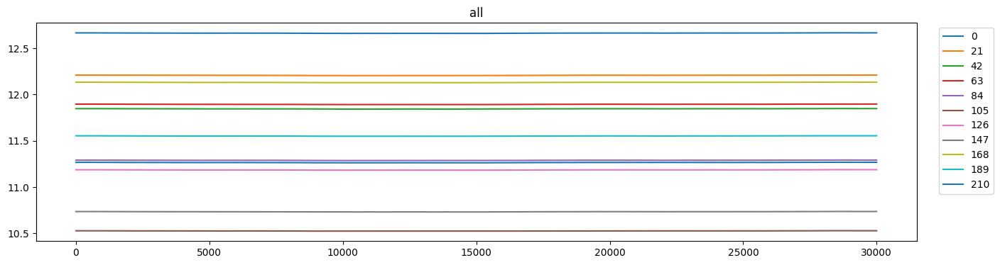

In [7]:
fit.draw_prior_sample()

In [8]:
samples, state = fit.perform_fit(fit_type = 'map')

Running map fit!


OPTIMIZE_KL: Starting 0001
M: →:1.0 ↺:False #∇²:06 |↘|:2.964882e+02 ➽:1.040006e+02
M: Iteration 1 ⛰:+4.298177e+08 Δ⛰:7.035238e+10
M: →:1.0 ↺:False #∇²:12 |↘|:1.397090e+02 ➽:1.040006e+02
M: Iteration 2 ⛰:+3.281482e+08 Δ⛰:1.016695e+08
M: →:1.0 ↺:False #∇²:18 |↘|:9.490653e+01 ➽:1.040006e+02
M: Iteration 3 ⛰:+1.188087e+08 Δ⛰:2.093395e+08
OPTIMIZE_KL: Iteration 0001 ⛰:+1.1881e+08
OPTIMIZE_KL: #(KL minimization steps) 3
OPTIMIZE_KL: Likelihood residual(s):
'reduced χ²: 3.6e+01±     0.0, avg:    +0.95±     0.0, #dof:6510000'

OPTIMIZE_KL: Prior residual(s):
cfmapax1fluctuations    :: 'reduced χ²:    0.14±     0.0, avg:    -0.38±     0.0, #dof:      1'
cfmapax1loglogavgslope  :: 'reduced χ²:     0.4±     0.0, avg:    -0.63±     0.0, #dof:      1'
cfmapxi                 :: 'reduced χ²:     1.0±     0.0, avg: +0.00066±     0.0, #dof:1000000'
cfmapzeromode           :: 'reduced χ²:    0.17±     0.0, avg:    -0.41±     0.0, #dof:      1'
combcf tod fluctuations :: 'reduced χ²:    0.05±     0.0, a

In [9]:
fit.printfitresults(samples)

Fit Results (res, init, std) for n_sub = 1

TODs:
	fluctuations: 0.0015191068848972337, 0.0015, 0.0001
	loglogvarslope: -1.9814613378337886, -2.45, 0.1
	zeromode std (LogNormal): 2.122393088190335e-06, 1e-05, 9.9e-06
map:
	fluctuations: 5.561262727530796e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.5634086756652428, -2.5, 0.1
	zeromode std (LogNormal): 4.135219745983556e-10, 1e-08, 1e-07


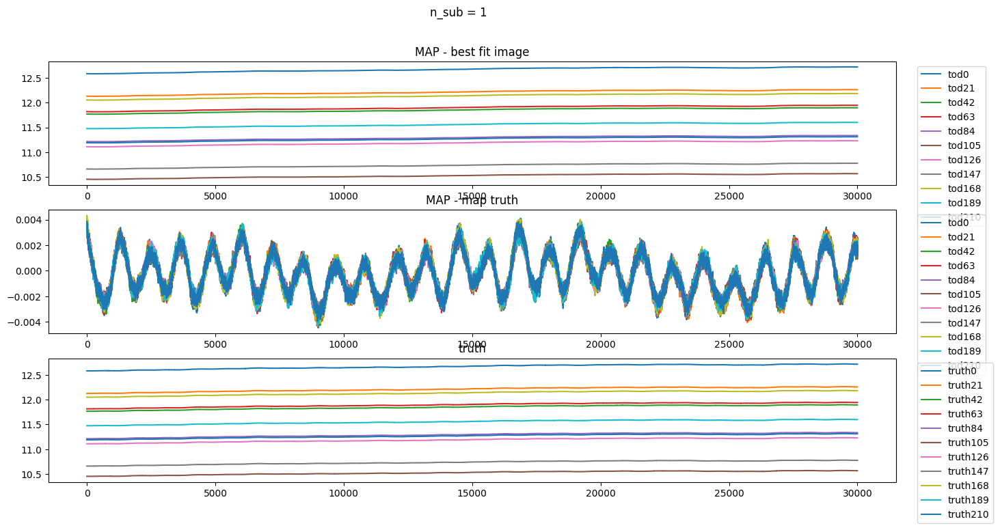

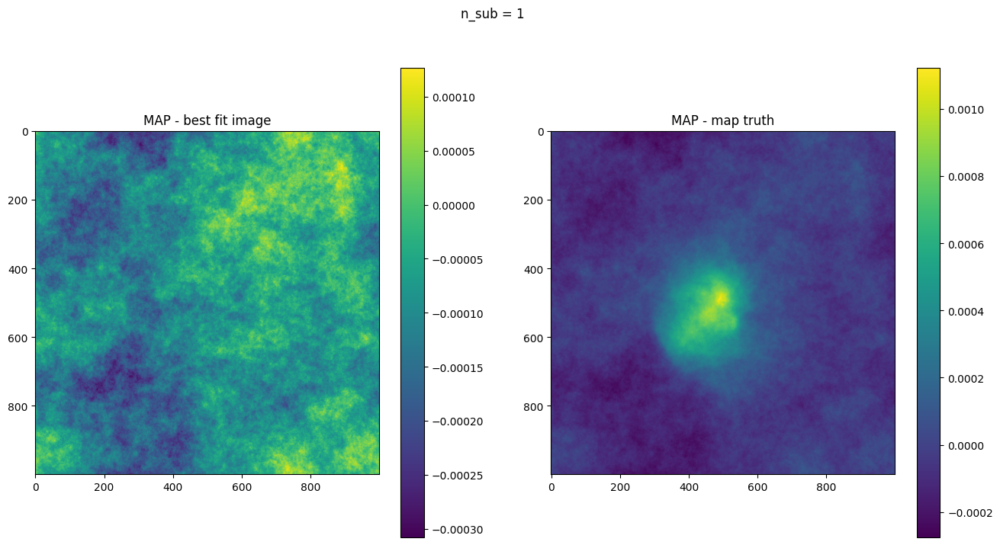

In [10]:
fit.plotfitresults(samples)

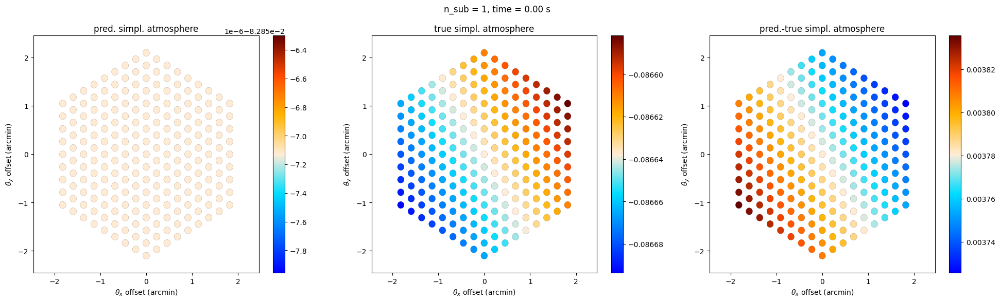

In [11]:
fig = fit.plot_atmosphere_det(samples)

In [12]:
# fit.make_atmosphere_det_gif(samples, figname='map.gif', tmax=2500)

# Full fit

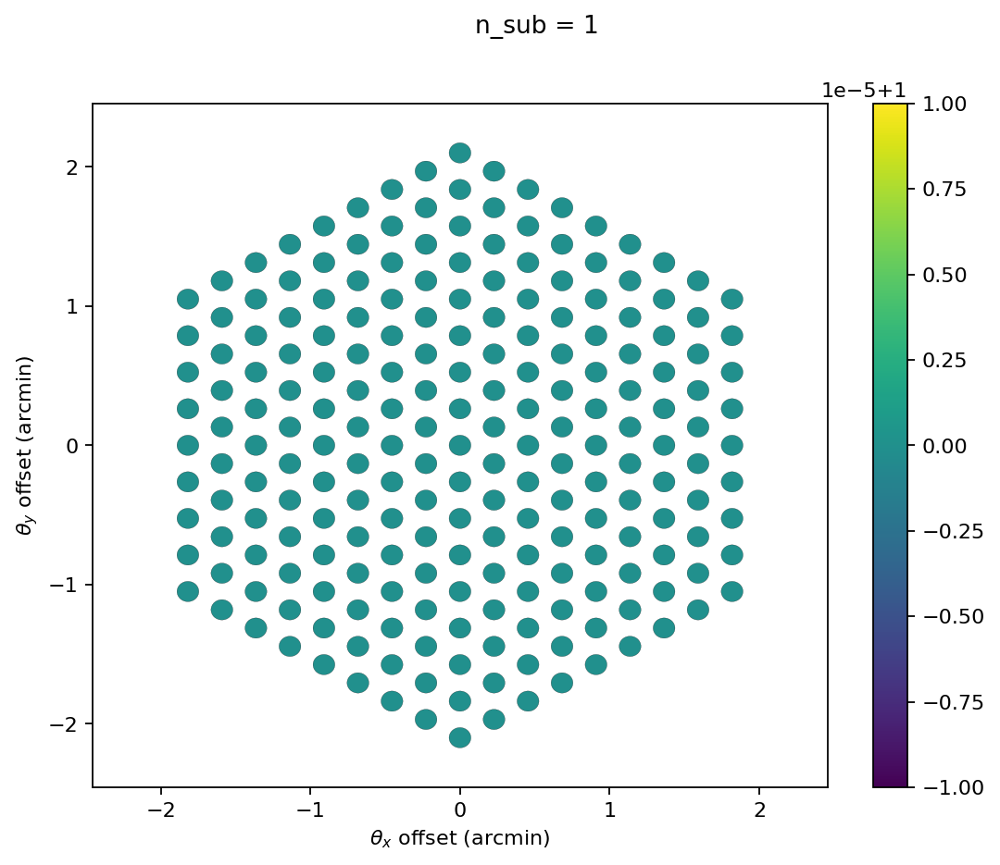

In [13]:
fit.plot_subdets()

# Hardcoded fit:

# Want to perform modularised fit:

OPTIMIZE_KL: Starting 0001


Running full fit!


SL: Iteration 0 ⛰:+1.8223e+08 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+2.1776e+07 Δ⛰:1.6046e+08 ➽:1.0400e+01
SL: Iteration 2 ⛰:+1.3256e+07 Δ⛰:8.5201e+06 ➽:1.0400e+01
SL: Iteration 3 ⛰:+5.8727e+06 Δ⛰:7.3830e+06 ➽:1.0400e+01
SL: Iteration 4 ⛰:+3.4568e+06 Δ⛰:2.4159e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+2.6032e+06 Δ⛰:8.5365e+05 ➽:1.0400e+01
SL: Iteration 6 ⛰:+1.1728e+06 Δ⛰:1.4304e+06 ➽:1.0400e+01
SL: Iteration 7 ⛰:+6.6305e+05 Δ⛰:5.0971e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:+4.2149e+05 Δ⛰:2.4157e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:+2.4740e+05 Δ⛰:1.7409e+05 ➽:1.0400e+01
SL: Iteration 10 ⛰:+7.8071e+04 Δ⛰:1.6933e+05 ➽:1.0400e+01
SL: Iteration 11 ⛰:+4.2132e+04 Δ⛰:3.5939e+04 ➽:1.0400e+01
SL: Iteration 12 ⛰:-3.6608e+04 Δ⛰:7.8740e+04 ➽:1.0400e+01
SL: Iteration 13 ⛰:-1.1575e+05 Δ⛰:7.9141e+04 ➽:1.0400e+01
SL: Iteration 14 ⛰:-1.2217e+05 Δ⛰:6.4249e+03 ➽:1.0400e+01
SL: Iteration 15 ⛰:-1.5209e+05 Δ⛰:2.9911e+04 ➽:1.0400e+01
SL: Iteration 16 ⛰:-2.3355e+05 Δ⛰:8.1468e+04 ➽:1.0400e+01
SL: Iteration 17 ⛰:-2.8902e+05 

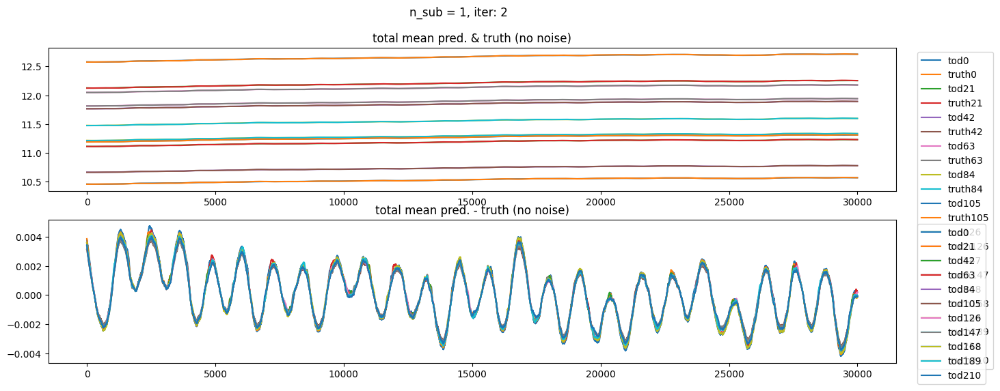

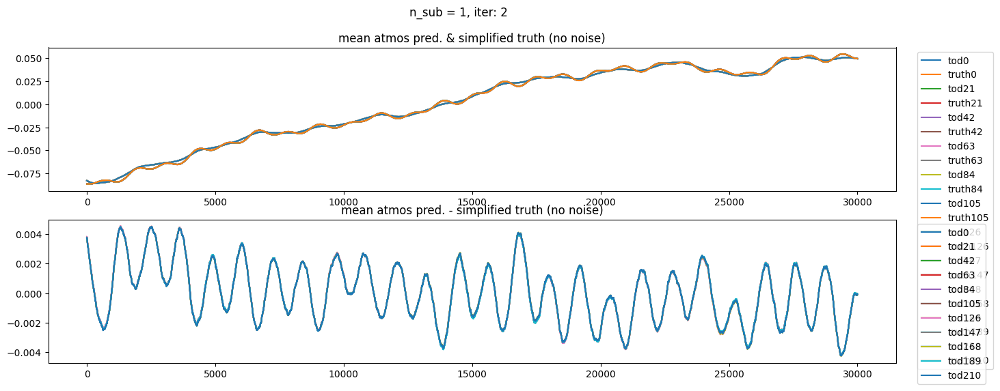

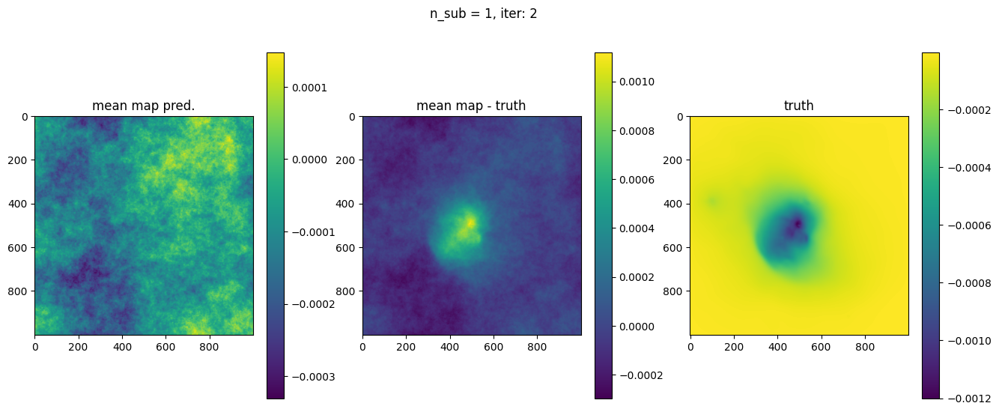

OPTIMIZE_KL: Starting 0003
SL: Iteration 0 ⛰:+1.8404e+08 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+1.1884e+08 Δ⛰:6.5204e+07 ➽:1.0400e+01
SL: Iteration 2 ⛰:+3.0355e+07 Δ⛰:8.8484e+07 ➽:1.0400e+01
SL: Iteration 3 ⛰:+6.0080e+06 Δ⛰:2.4347e+07 ➽:1.0400e+01
SL: Iteration 4 ⛰:+4.6230e+06 Δ⛰:1.3850e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+3.1293e+06 Δ⛰:1.4937e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+2.3510e+06 Δ⛰:7.7832e+05 ➽:1.0400e+01
SL: Iteration 7 ⛰:+1.6619e+06 Δ⛰:6.8909e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:+9.7560e+05 Δ⛰:6.8629e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:+7.1349e+05 Δ⛰:2.6212e+05 ➽:1.0400e+01
SL: Iteration 10 ⛰:+6.4611e+05 Δ⛰:6.7373e+04 ➽:1.0400e+01
SL: Iteration 11 ⛰:+4.8334e+05 Δ⛰:1.6277e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:+3.2575e+05 Δ⛰:1.5759e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:+2.1771e+05 Δ⛰:1.0804e+05 ➽:1.0400e+01
SL: Iteration 14 ⛰:+2.0847e+05 Δ⛰:9.2427e+03 ➽:1.0400e+01
SL: Iteration 15 ⛰:+1.3211e+05 Δ⛰:7.6366e+04 ➽:1.0400e+01
SL: Iteration 16 ⛰:+3.2868e+04 Δ⛰:9.9237e+04 ➽:1.0400e+01
SL: 

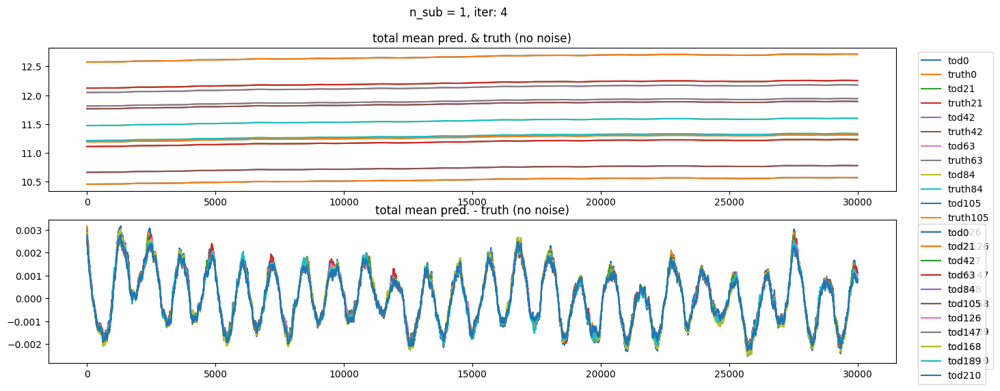

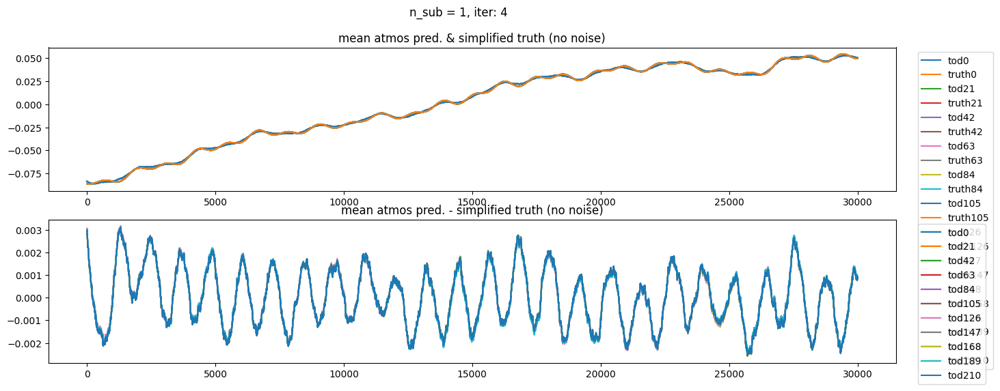

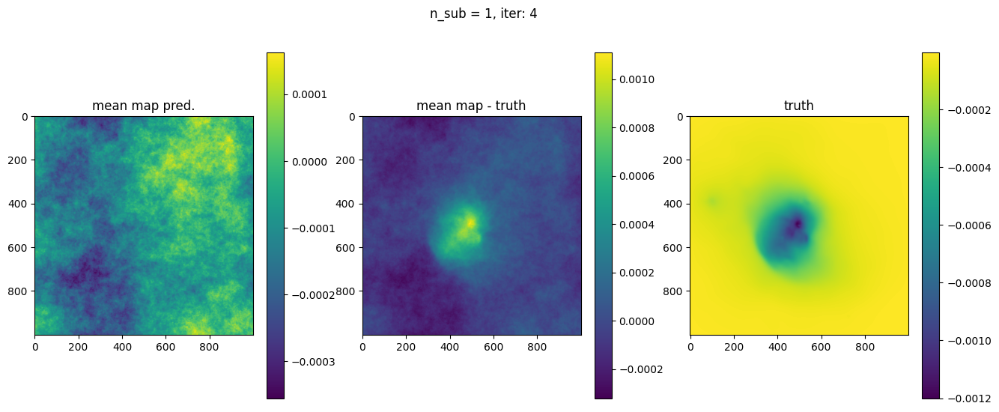

OPTIMIZE_KL: Starting 0005
SL: Iteration 0 ⛰:+1.6283e+08 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+5.5166e+07 Δ⛰:1.0767e+08 ➽:1.0400e+01
SL: Iteration 2 ⛰:+2.7886e+07 Δ⛰:2.7280e+07 ➽:1.0400e+01
SL: Iteration 3 ⛰:+1.9585e+07 Δ⛰:8.3017e+06 ➽:1.0400e+01
SL: Iteration 4 ⛰:+1.3407e+07 Δ⛰:6.1772e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+8.6014e+06 Δ⛰:4.8061e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+6.5698e+06 Δ⛰:2.0315e+06 ➽:1.0400e+01
SL: Iteration 7 ⛰:+3.9993e+06 Δ⛰:2.5705e+06 ➽:1.0400e+01
SL: Iteration 8 ⛰:+2.8992e+06 Δ⛰:1.1001e+06 ➽:1.0400e+01
SL: Iteration 9 ⛰:+2.8820e+06 Δ⛰:1.7190e+04 ➽:1.0400e+01
SL: Iteration 10 ⛰:+2.2893e+06 Δ⛰:5.9264e+05 ➽:1.0400e+01
SL: Iteration 11 ⛰:+1.8695e+06 Δ⛰:4.1985e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:+1.4022e+06 Δ⛰:4.6725e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:+1.1360e+06 Δ⛰:2.6623e+05 ➽:1.0400e+01
SL: Iteration 14 ⛰:+8.2720e+05 Δ⛰:3.0880e+05 ➽:1.0400e+01
SL: Iteration 15 ⛰:+7.3960e+05 Δ⛰:8.7603e+04 ➽:1.0400e+01
SL: Iteration 16 ⛰:+7.1396e+05 Δ⛰:2.5641e+04 ➽:1.0400e+01
SL: 

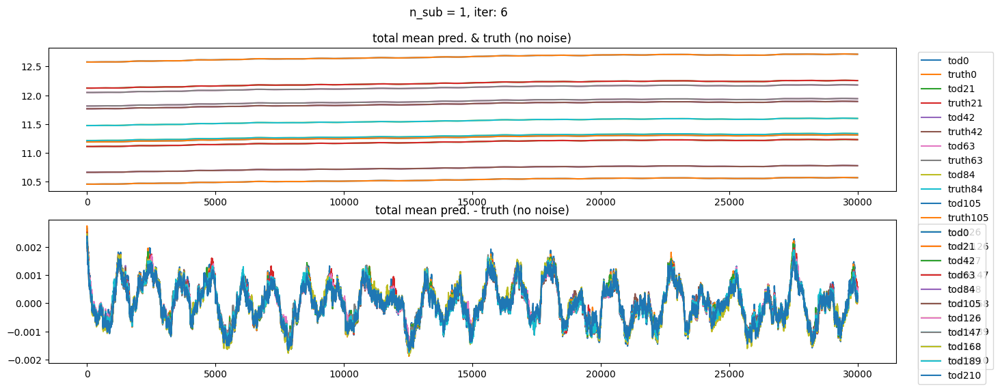

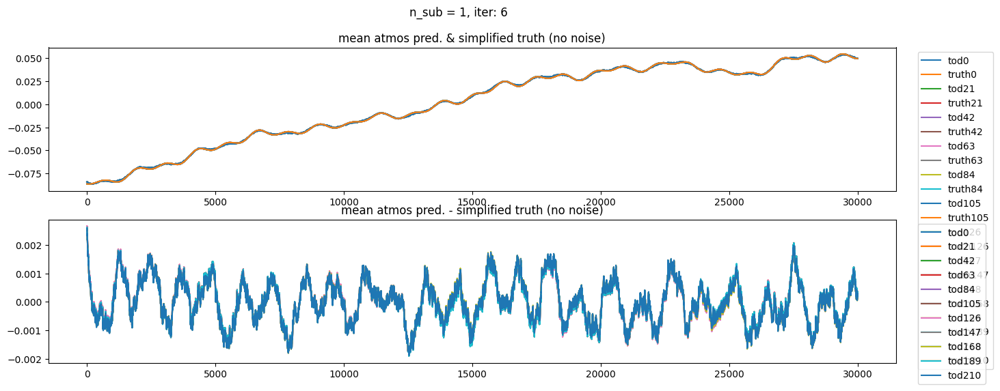

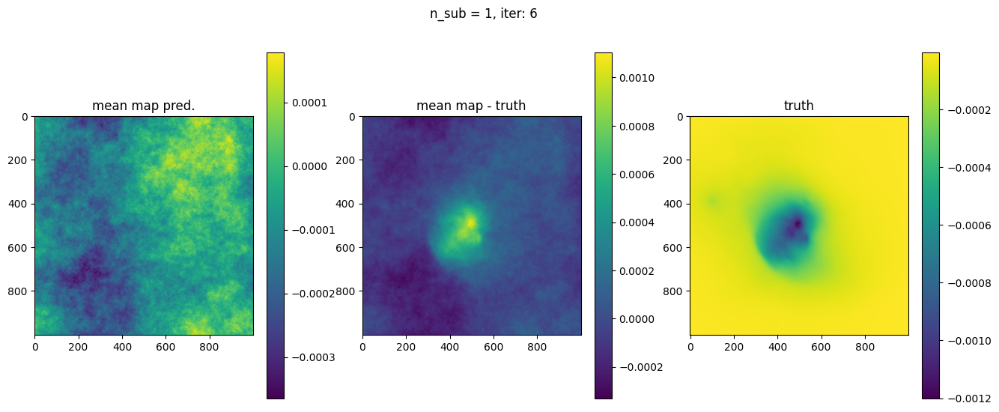

OPTIMIZE_KL: Starting 0007
SL: Iteration 0 ⛰:+2.2718e+08 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+1.8370e+08 Δ⛰:4.3482e+07 ➽:1.0400e+01
SL: Iteration 2 ⛰:+4.0087e+07 Δ⛰:1.4361e+08 ➽:1.0400e+01
SL: Iteration 3 ⛰:+2.4865e+07 Δ⛰:1.5222e+07 ➽:1.0400e+01
SL: Iteration 4 ⛰:+1.8531e+07 Δ⛰:6.3338e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+9.2631e+06 Δ⛰:9.2683e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+6.5182e+06 Δ⛰:2.7449e+06 ➽:1.0400e+01
SL: Iteration 7 ⛰:+5.5081e+06 Δ⛰:1.0101e+06 ➽:1.0400e+01
SL: Iteration 8 ⛰:+3.9369e+06 Δ⛰:1.5712e+06 ➽:1.0400e+01
SL: Iteration 9 ⛰:+3.4638e+06 Δ⛰:4.7307e+05 ➽:1.0400e+01
SL: Iteration 10 ⛰:+3.3921e+06 Δ⛰:7.1679e+04 ➽:1.0400e+01
SL: Iteration 11 ⛰:+2.9733e+06 Δ⛰:4.1882e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:+2.7146e+06 Δ⛰:2.5871e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:+2.4092e+06 Δ⛰:3.0544e+05 ➽:1.0400e+01
SL: Iteration 14 ⛰:+2.0383e+06 Δ⛰:3.7082e+05 ➽:1.0400e+01
SL: Iteration 15 ⛰:+1.7161e+06 Δ⛰:3.2228e+05 ➽:1.0400e+01
SL: Iteration 16 ⛰:+1.6858e+06 Δ⛰:3.0289e+04 ➽:1.0400e+01
SL: 

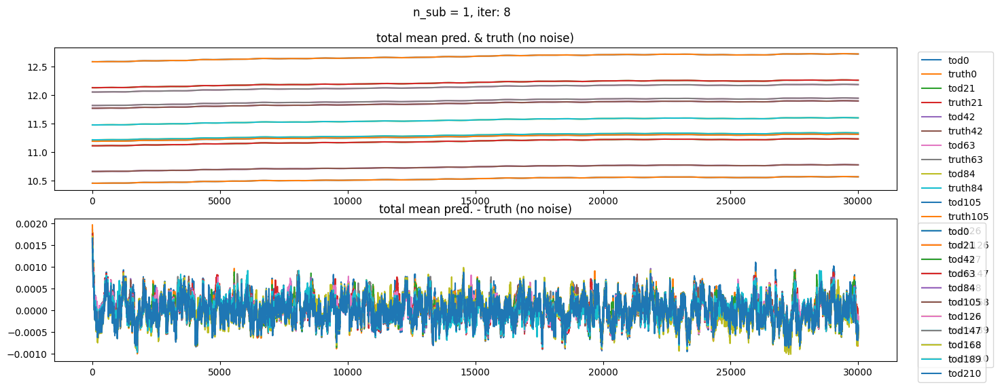

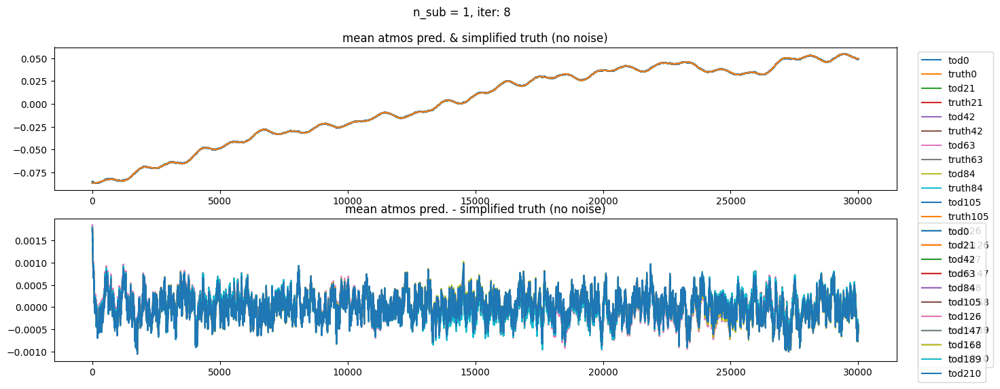

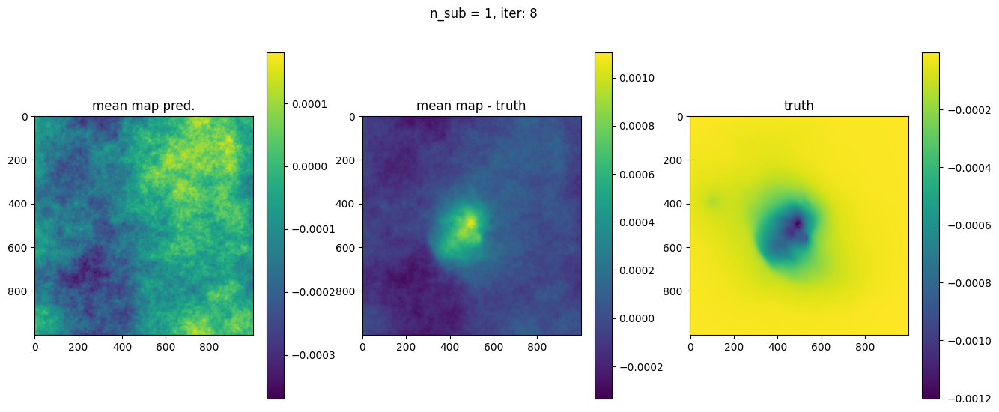

OPTIMIZE_KL: Starting 0009
SL: Iteration 0 ⛰:+3.6234e+08 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+7.8273e+07 Δ⛰:2.8407e+08 ➽:1.0400e+01
SL: Iteration 2 ⛰:+3.6312e+07 Δ⛰:4.1961e+07 ➽:1.0400e+01
SL: Iteration 3 ⛰:+2.0222e+07 Δ⛰:1.6090e+07 ➽:1.0400e+01
SL: Iteration 4 ⛰:+1.5661e+07 Δ⛰:4.5615e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+9.8774e+06 Δ⛰:5.7831e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+7.1392e+06 Δ⛰:2.7383e+06 ➽:1.0400e+01
SL: Iteration 7 ⛰:+6.3013e+06 Δ⛰:8.3782e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:+4.9481e+06 Δ⛰:1.3533e+06 ➽:1.0400e+01
SL: Iteration 9 ⛰:+4.9159e+06 Δ⛰:3.2191e+04 ➽:1.0400e+01
SL: Iteration 10 ⛰:+4.1538e+06 Δ⛰:7.6202e+05 ➽:1.0400e+01
SL: Iteration 11 ⛰:+3.6210e+06 Δ⛰:5.3282e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:+3.1608e+06 Δ⛰:4.6019e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:+2.7825e+06 Δ⛰:3.7833e+05 ➽:1.0400e+01
SL: Iteration 14 ⛰:+2.3764e+06 Δ⛰:4.0606e+05 ➽:1.0400e+01
SL: Iteration 15 ⛰:+2.3334e+06 Δ⛰:4.3024e+04 ➽:1.0400e+01
SL: Iteration 16 ⛰:+2.0421e+06 Δ⛰:2.9134e+05 ➽:1.0400e+01
SL: 

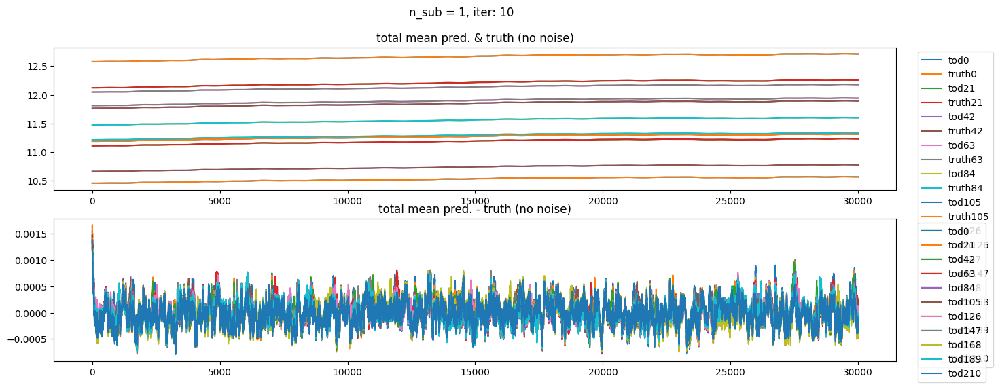

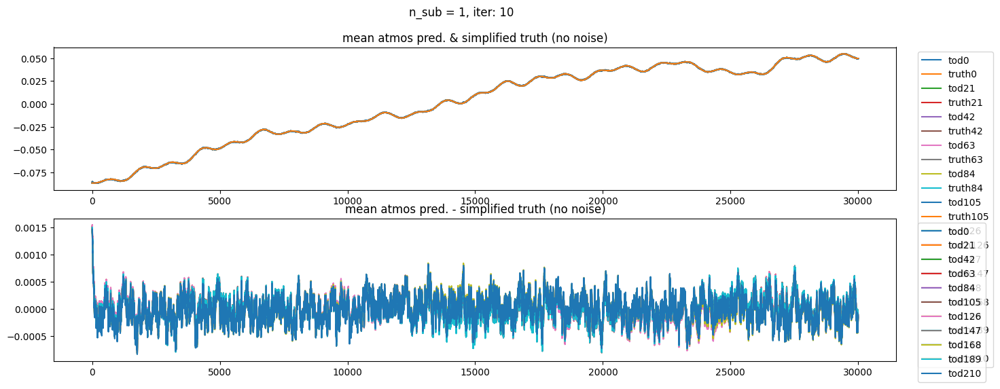

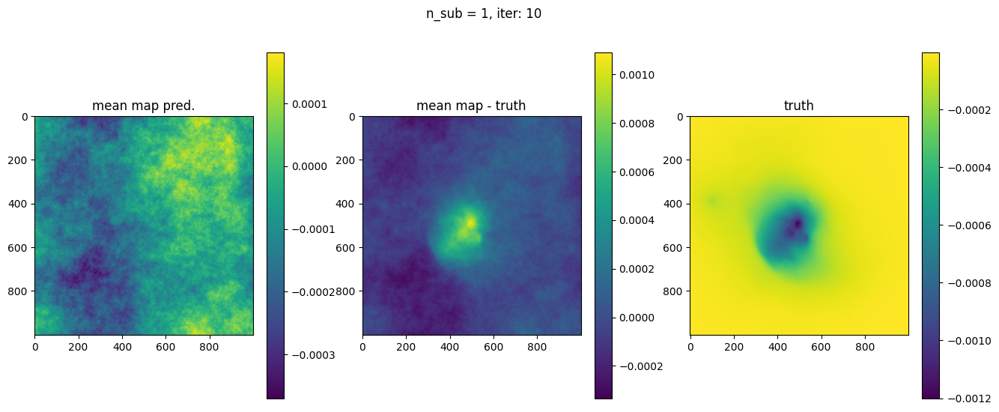

OPTIMIZE_KL: Starting 0011
SL: Iteration 0 ⛰:+1.0135e+08 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+6.2324e+07 Δ⛰:3.9023e+07 ➽:1.0400e+01
SL: Iteration 2 ⛰:+2.4916e+07 Δ⛰:3.7408e+07 ➽:1.0400e+01
SL: Iteration 3 ⛰:+1.8813e+07 Δ⛰:6.1029e+06 ➽:1.0400e+01
SL: Iteration 4 ⛰:+1.1359e+07 Δ⛰:7.4539e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+7.8227e+06 Δ⛰:3.5367e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+6.2978e+06 Δ⛰:1.5249e+06 ➽:1.0400e+01
SL: Iteration 7 ⛰:+5.4583e+06 Δ⛰:8.3946e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:+4.5103e+06 Δ⛰:9.4799e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:+4.4797e+06 Δ⛰:3.0636e+04 ➽:1.0400e+01
SL: Iteration 10 ⛰:+3.8197e+06 Δ⛰:6.6001e+05 ➽:1.0400e+01
SL: Iteration 11 ⛰:+3.3693e+06 Δ⛰:4.5032e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:+2.9044e+06 Δ⛰:4.6498e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:+2.4259e+06 Δ⛰:4.7841e+05 ➽:1.0400e+01
SL: Iteration 14 ⛰:+2.1632e+06 Δ⛰:2.6272e+05 ➽:1.0400e+01
SL: Iteration 15 ⛰:+1.8763e+06 Δ⛰:2.8697e+05 ➽:1.0400e+01
SL: Iteration 16 ⛰:+1.8733e+06 Δ⛰:2.9865e+03 ➽:1.0400e+01
SL: 

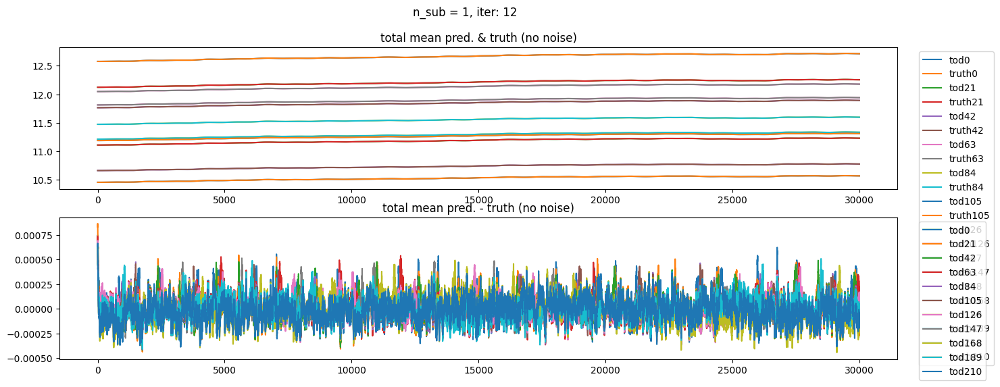

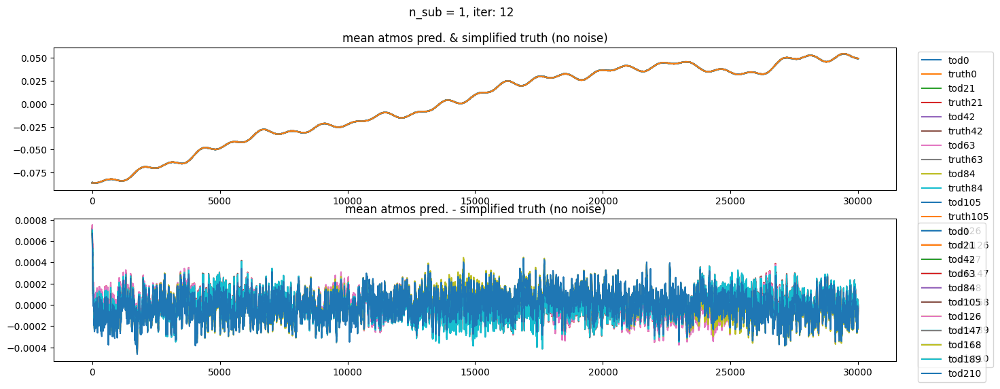

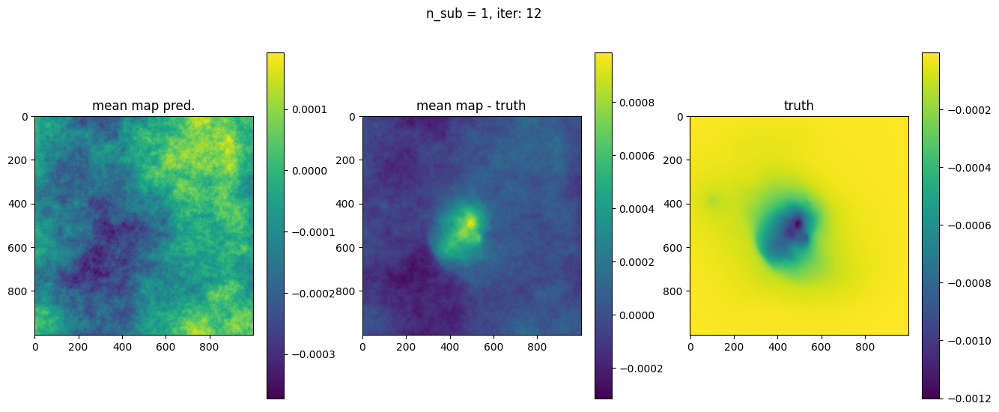

OPTIMIZE_KL: Starting 0013
SL: Iteration 0 ⛰:+1.4050e+08 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+9.4882e+07 Δ⛰:4.5617e+07 ➽:1.0400e+01
SL: Iteration 2 ⛰:+2.9724e+07 Δ⛰:6.5159e+07 ➽:1.0400e+01
SL: Iteration 3 ⛰:+1.5689e+07 Δ⛰:1.4035e+07 ➽:1.0400e+01
SL: Iteration 4 ⛰:+1.1565e+07 Δ⛰:4.1235e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+7.1541e+06 Δ⛰:4.4110e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+5.5928e+06 Δ⛰:1.5613e+06 ➽:1.0400e+01
SL: Iteration 7 ⛰:+4.5239e+06 Δ⛰:1.0689e+06 ➽:1.0400e+01
SL: Iteration 8 ⛰:+3.2147e+06 Δ⛰:1.3092e+06 ➽:1.0400e+01
SL: Iteration 9 ⛰:+3.1654e+06 Δ⛰:4.9239e+04 ➽:1.0400e+01
SL: Iteration 10 ⛰:+2.3811e+06 Δ⛰:7.8429e+05 ➽:1.0400e+01
SL: Iteration 11 ⛰:+2.0036e+06 Δ⛰:3.7757e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:+1.6338e+06 Δ⛰:3.6971e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:+1.3306e+06 Δ⛰:3.0324e+05 ➽:1.0400e+01
SL: Iteration 14 ⛰:+1.0843e+06 Δ⛰:2.4627e+05 ➽:1.0400e+01
SL: Iteration 15 ⛰:+8.4865e+05 Δ⛰:2.3568e+05 ➽:1.0400e+01
SL: Iteration 16 ⛰:+8.4756e+05 Δ⛰:1.0926e+03 ➽:1.0400e+01
SL: 

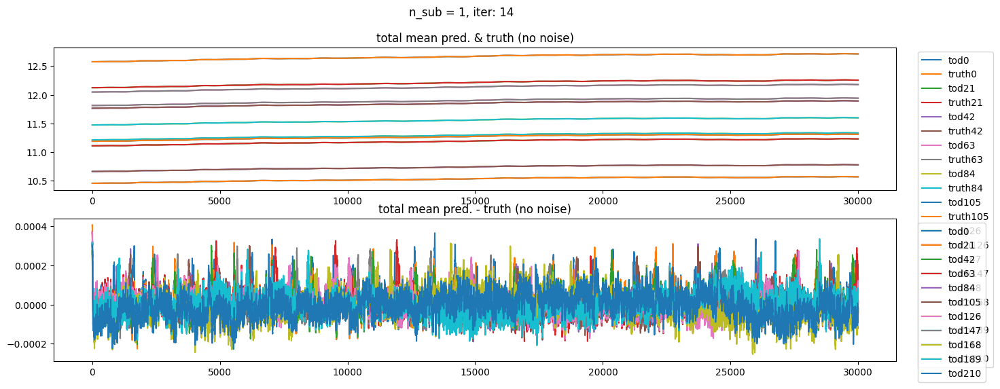

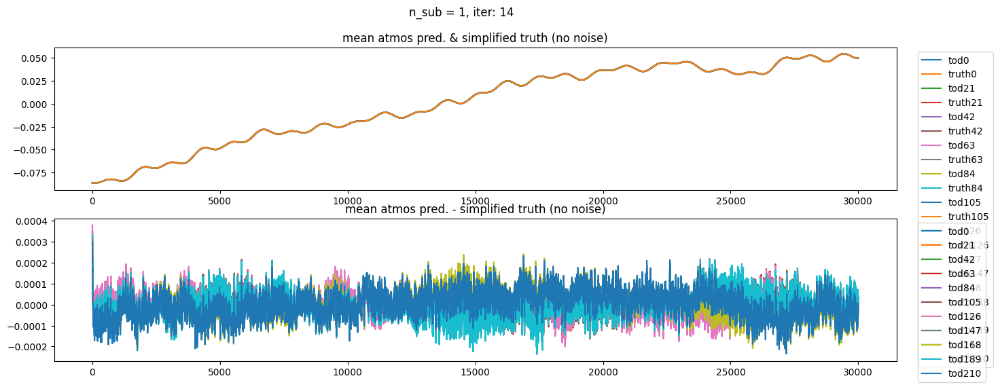

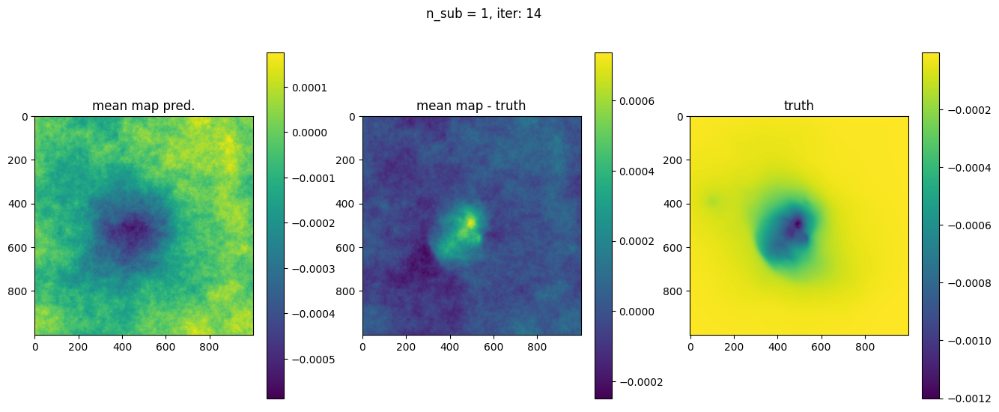

OPTIMIZE_KL: Starting 0015
SL: Iteration 0 ⛰:+1.2009e+08 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+9.1497e+07 Δ⛰:2.8598e+07 ➽:1.0400e+01
SL: Iteration 2 ⛰:+2.6789e+07 Δ⛰:6.4708e+07 ➽:1.0400e+01
SL: Iteration 3 ⛰:+1.5670e+07 Δ⛰:1.1119e+07 ➽:1.0400e+01
SL: Iteration 4 ⛰:+9.2791e+06 Δ⛰:6.3909e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+4.1959e+06 Δ⛰:5.0831e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+3.5221e+06 Δ⛰:6.7384e+05 ➽:1.0400e+01
SL: Iteration 7 ⛰:+2.6610e+06 Δ⛰:8.6107e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:+2.1575e+06 Δ⛰:5.0356e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:+2.0900e+06 Δ⛰:6.7511e+04 ➽:1.0400e+01
SL: Iteration 10 ⛰:+1.6531e+06 Δ⛰:4.3691e+05 ➽:1.0400e+01
SL: Iteration 11 ⛰:+1.1710e+06 Δ⛰:4.8208e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:+7.5862e+05 Δ⛰:4.1235e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:+5.2838e+05 Δ⛰:2.3024e+05 ➽:1.0400e+01
SL: Iteration 14 ⛰:+3.3211e+05 Δ⛰:1.9627e+05 ➽:1.0400e+01
SL: Iteration 15 ⛰:+2.5055e+05 Δ⛰:8.1555e+04 ➽:1.0400e+01
SL: Iteration 16 ⛰:+2.1080e+05 Δ⛰:3.9748e+04 ➽:1.0400e+01
SL: 

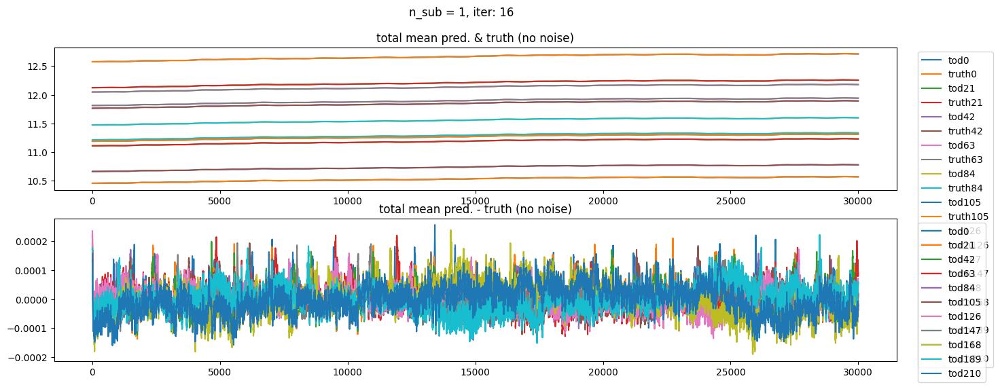

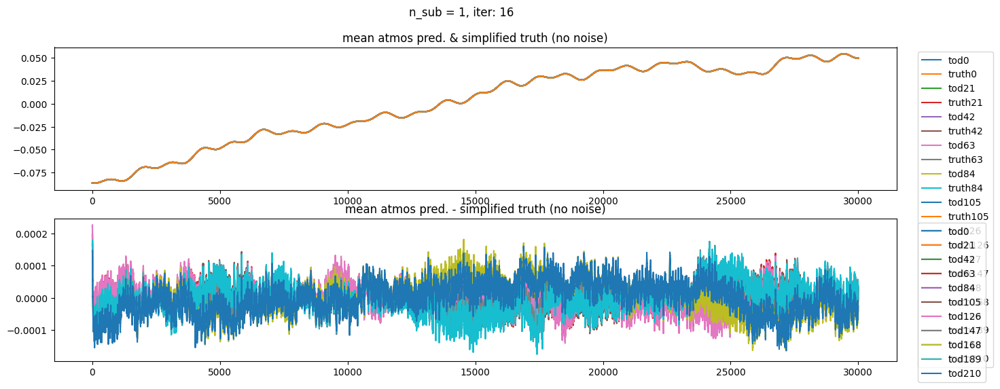

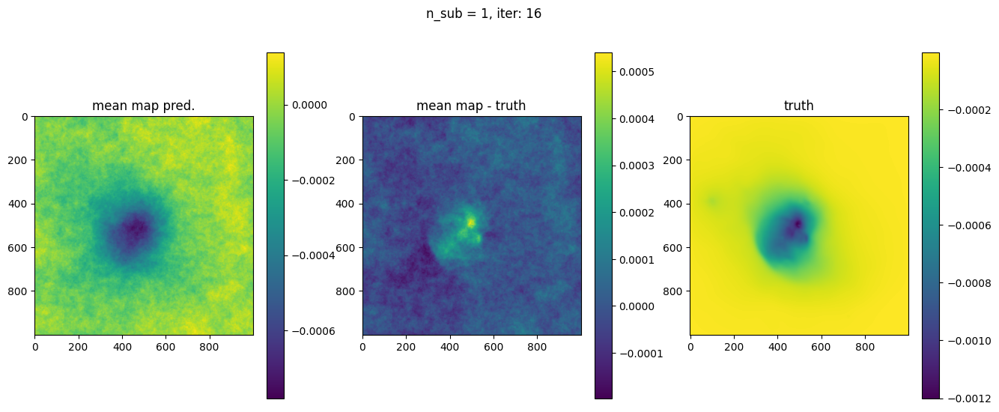

OPTIMIZE_KL: Starting 0017
SL: Iteration 0 ⛰:+1.3363e+09 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+2.3724e+07 Δ⛰:1.3125e+09 ➽:1.0400e+01
SL: Iteration 2 ⛰:+8.3448e+06 Δ⛰:1.5380e+07 ➽:1.0400e+01
SL: Iteration 3 ⛰:+4.4915e+06 Δ⛰:3.8533e+06 ➽:1.0400e+01
SL: Iteration 4 ⛰:+3.2715e+06 Δ⛰:1.2199e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+2.7355e+06 Δ⛰:5.3601e+05 ➽:1.0400e+01
SL: Iteration 6 ⛰:+1.6024e+06 Δ⛰:1.1332e+06 ➽:1.0400e+01
SL: Iteration 7 ⛰:+1.3896e+06 Δ⛰:2.1273e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:+1.0959e+06 Δ⛰:2.9370e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:+9.6151e+05 Δ⛰:1.3440e+05 ➽:1.0400e+01
SL: Iteration 10 ⛰:+7.1135e+05 Δ⛰:2.5016e+05 ➽:1.0400e+01
SL: Iteration 11 ⛰:+3.8549e+05 Δ⛰:3.2586e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:+1.5559e+05 Δ⛰:2.2990e+05 ➽:1.0400e+01
SL: Iteration 13 ⛰:+2.2031e+04 Δ⛰:1.3356e+05 ➽:1.0400e+01
SL: Iteration 14 ⛰:+6.4415e+03 Δ⛰:1.5590e+04 ➽:1.0400e+01
SL: Iteration 15 ⛰:-4.2473e+03 Δ⛰:1.0689e+04 ➽:1.0400e+01
SL: Iteration 16 ⛰:-4.7401e+04 Δ⛰:4.3154e+04 ➽:1.0400e+01
SL: 

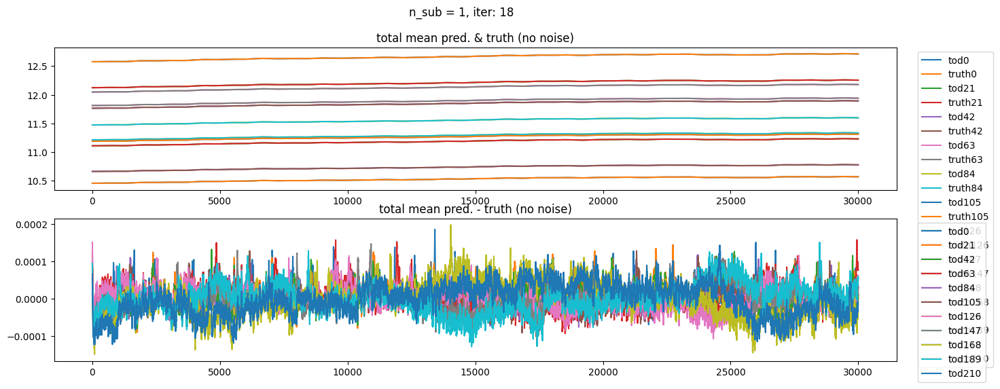

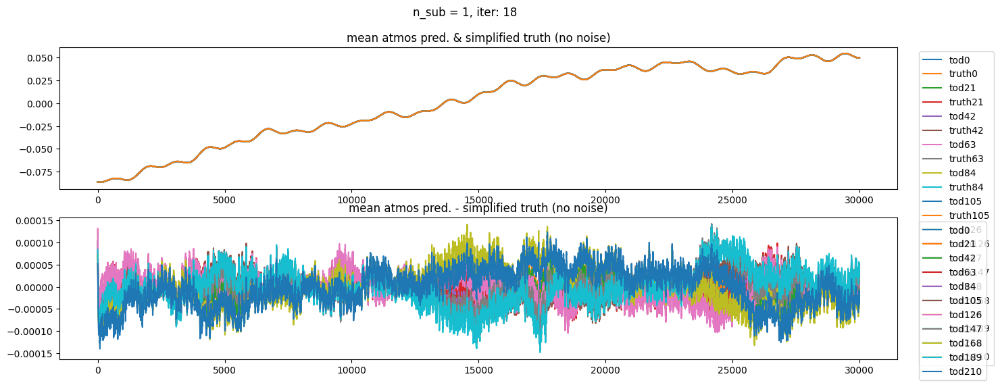

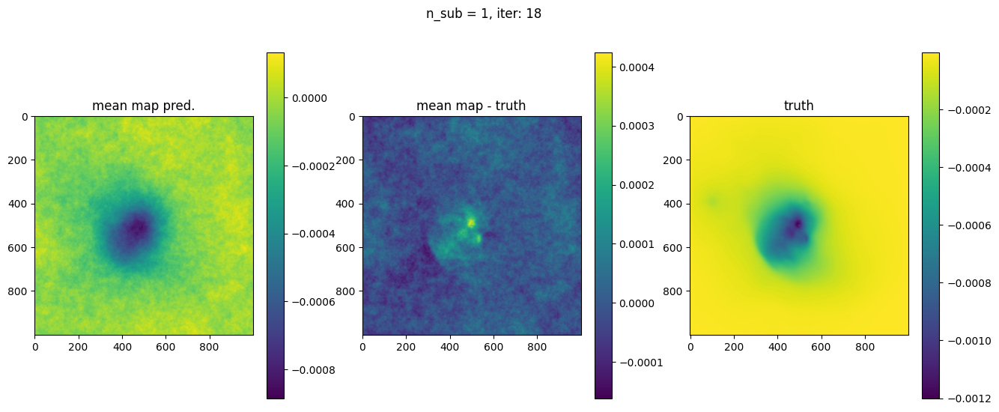

OPTIMIZE_KL: Starting 0019
SL: Iteration 0 ⛰:+4.0564e+07 Δ⛰:inf ➽:1.0400e+01
SL: Iteration 1 ⛰:+1.3851e+07 Δ⛰:2.6713e+07 ➽:1.0400e+01
SL: Iteration 2 ⛰:+1.1255e+07 Δ⛰:2.5956e+06 ➽:1.0400e+01
SL: Iteration 3 ⛰:+6.1272e+06 Δ⛰:5.1279e+06 ➽:1.0400e+01
SL: Iteration 4 ⛰:+4.5823e+06 Δ⛰:1.5449e+06 ➽:1.0400e+01
SL: Iteration 5 ⛰:+2.6420e+06 Δ⛰:1.9403e+06 ➽:1.0400e+01
SL: Iteration 6 ⛰:+1.5851e+06 Δ⛰:1.0569e+06 ➽:1.0400e+01
SL: Iteration 7 ⛰:+7.8024e+05 Δ⛰:8.0490e+05 ➽:1.0400e+01
SL: Iteration 8 ⛰:+4.9870e+05 Δ⛰:2.8154e+05 ➽:1.0400e+01
SL: Iteration 9 ⛰:+4.5716e+05 Δ⛰:4.1535e+04 ➽:1.0400e+01
SL: Iteration 10 ⛰:+2.5876e+05 Δ⛰:1.9840e+05 ➽:1.0400e+01
SL: Iteration 11 ⛰:+1.1868e+04 Δ⛰:2.4690e+05 ➽:1.0400e+01
SL: Iteration 12 ⛰:-6.6648e+04 Δ⛰:7.8515e+04 ➽:1.0400e+01
SL: Iteration 13 ⛰:-1.2755e+05 Δ⛰:6.0903e+04 ➽:1.0400e+01
SL: Iteration 14 ⛰:-1.5166e+05 Δ⛰:2.4105e+04 ➽:1.0400e+01
SL: Iteration 15 ⛰:-1.6048e+05 Δ⛰:8.8283e+03 ➽:1.0400e+01
SL: Iteration 16 ⛰:-2.0999e+05 Δ⛰:4.9507e+04 ➽:1.0400e+01
SL: 

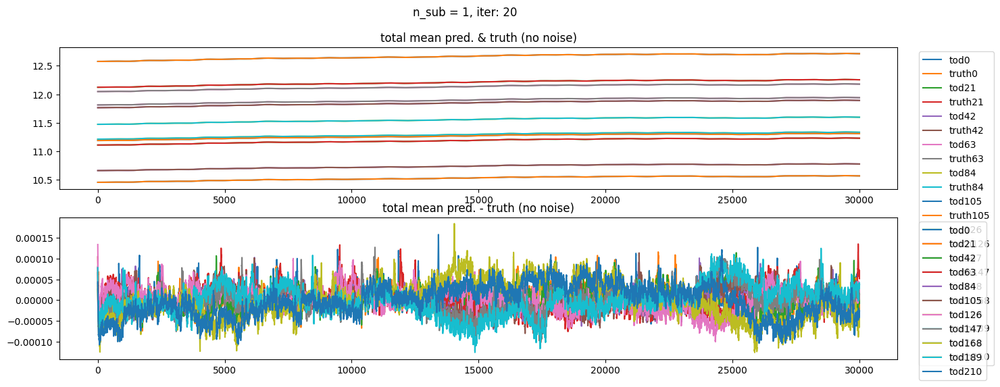

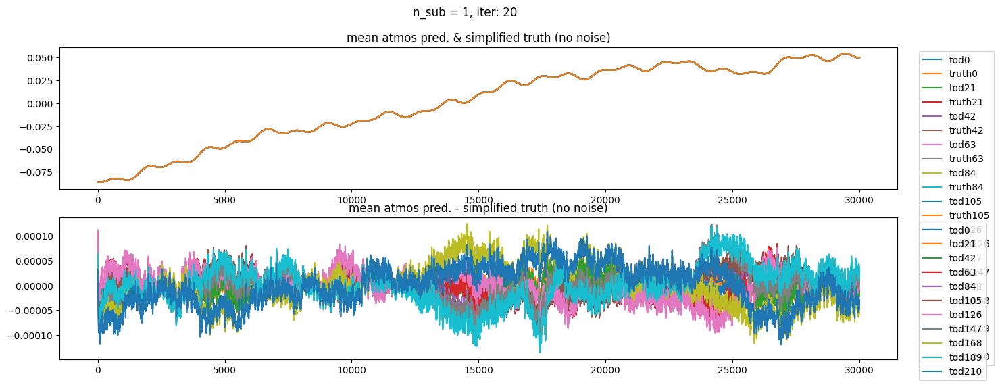

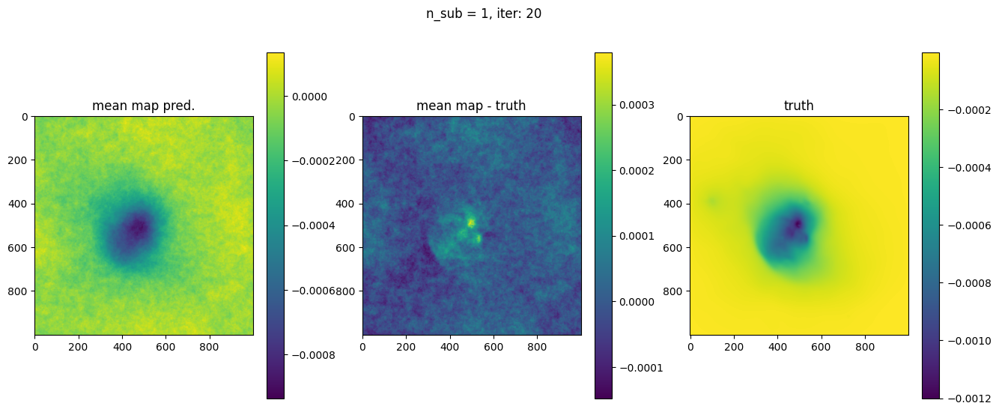

In [14]:
samples, state = fit.perform_fit(n_it=20, printevery=2)
# samples, state = fit.perform_fit(n_it=1, printevery=1)

In [15]:
fit.printfitresults(samples)

Fit Results (res, init, std) for n_sub = 1

TODs:
	fluctuations: 0.0013254348864072379, 0.0015, 0.0001
	loglogvarslope: -2.4512985999245003, -2.45, 0.1
	zeromode std (LogNormal): 4.73455108748856e-06, 1e-05, 9.9e-06
map:
	fluctuations: 4.528604765199307e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.424766728234212, -2.5, 0.1
	zeromode std (LogNormal): 4.26650965853739e-10, 1e-08, 1e-07


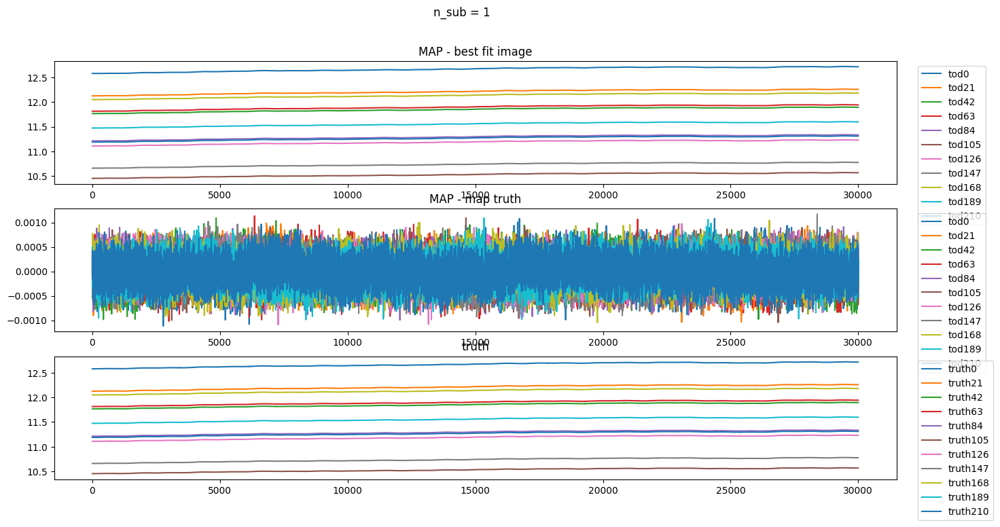

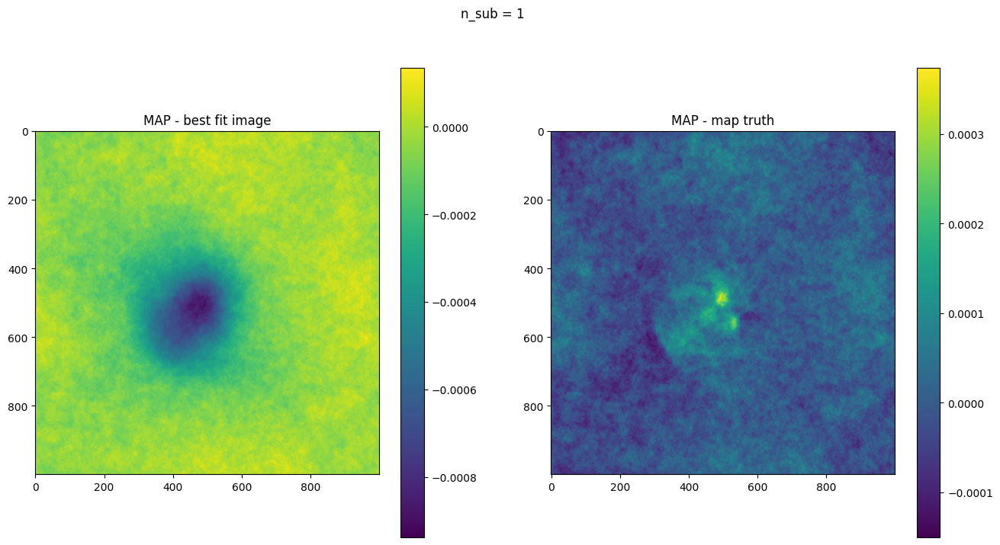

In [16]:
fit.plotfitresults(samples)

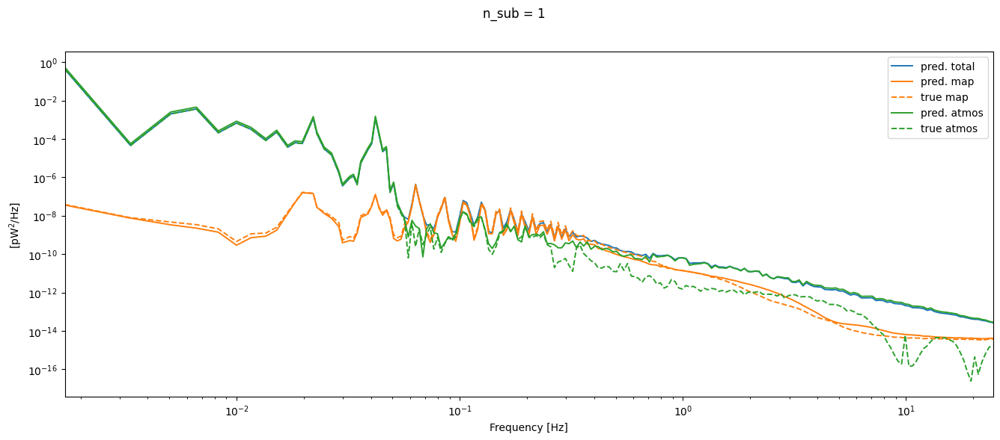

In [17]:
fit.plotpowerspectrum(samples)

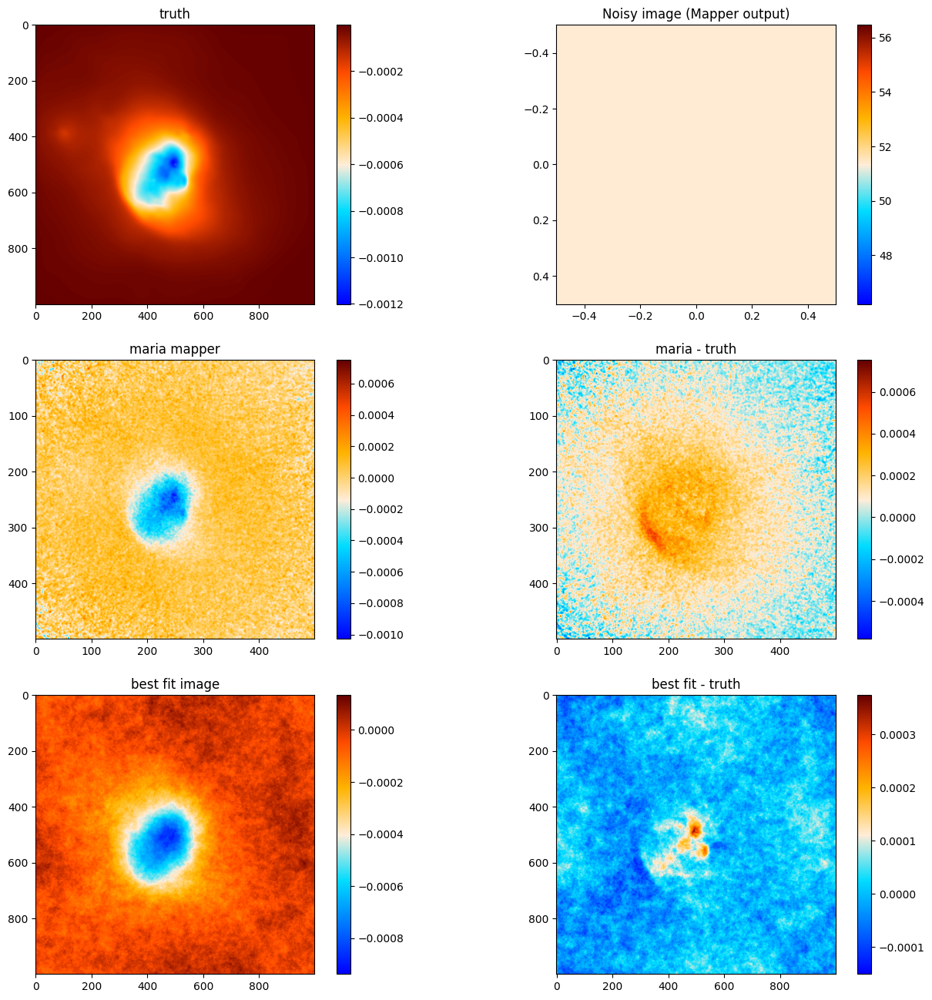

In [18]:
fit.plotrecos(samples)

In [19]:
assert False

AssertionError: 

# Extend det to two halves:

In [ ]:
fit.init_gps(n_sub=2, samples=samples)

assuming a diagonal covariance matrix;
setting `std_inv` to `cov_inv(ones_like(data))**0.5`


(2, 217)
Will initialise GPs for atmosphere in 2 parts based on samples.
Initialised gp_tod: Model(
	<function CFM.finalize.<locals>.correlated_field at 0x151e31dd4360>,
	domain={'combcf tod fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf tod loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf xi': ShapeWithDtype(shape=(2, 40000), dtype=<class 'jax.numpy.float64'>),
	 'combcf zeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)},
	init=Initializer(
		{'combcf tod fluctuations': functools.partial(<function random_like at 0x1524fafc2340>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'combcf tod loglogavgslope': functools.partial(<function random_like at 0x1524fafc2340>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'combcf xi': functools.partial(<function random_like at 0x1524fafc2340>, primals=ShapeWithDtype(shape=(2, 40000), dtype=<class 'ja

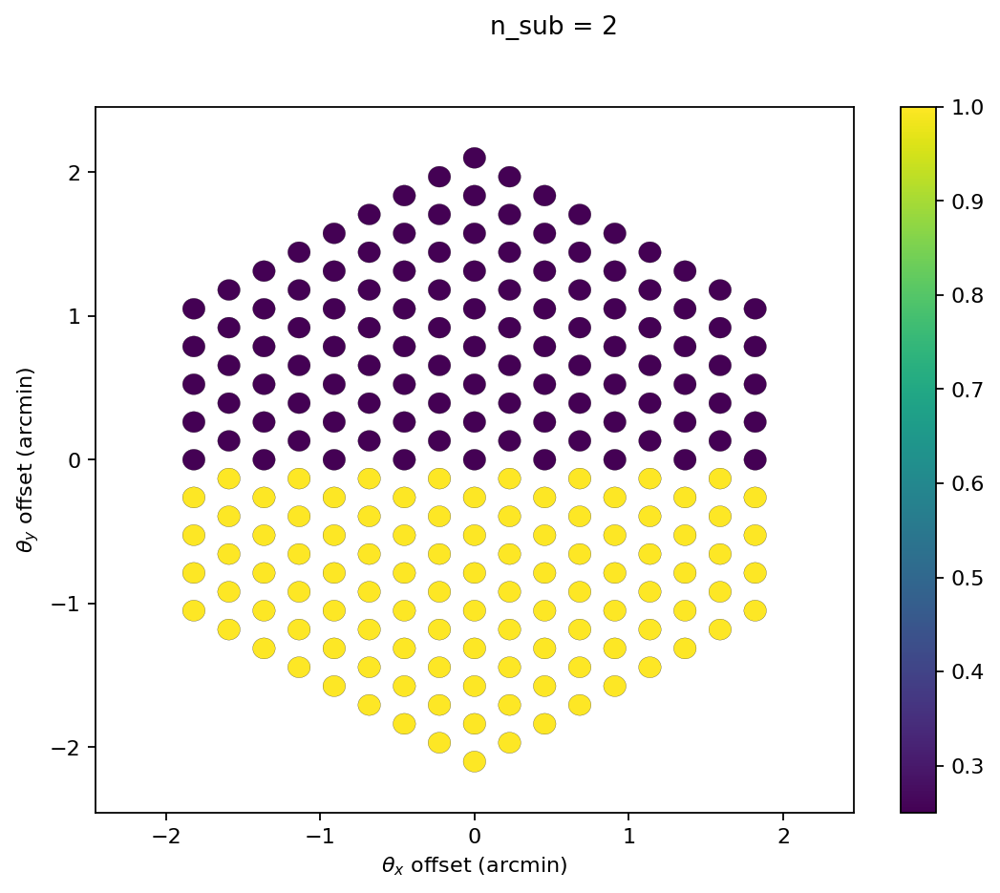

In [ ]:
fit.plot_subdets()

In [ ]:
samples, state = fit.perform_fit(n_it=2, printevery=4)

OPTIMIZE_KL: Starting 0001
SL: Iteration 0 ⛰:+2.7794e+08 Δ⛰:inf ➽:1.1001e+01
SL: Iteration 1 ⛰:+2.6221e+08 Δ⛰:1.5725e+07 ➽:1.1001e+01
SL: Iteration 2 ⛰:+4.8232e+07 Δ⛰:2.1398e+08 ➽:1.1001e+01
SL: Iteration 3 ⛰:+3.2695e+07 Δ⛰:1.5536e+07 ➽:1.1001e+01
SL: Iteration 4 ⛰:+1.5705e+07 Δ⛰:1.6990e+07 ➽:1.1001e+01
SL: Iteration 5 ⛰:+1.0668e+07 Δ⛰:5.0369e+06 ➽:1.1001e+01
SL: Iteration 6 ⛰:+9.3100e+06 Δ⛰:1.3579e+06 ➽:1.1001e+01
SL: Iteration 7 ⛰:+7.8863e+06 Δ⛰:1.4238e+06 ➽:1.1001e+01
SL: Iteration 8 ⛰:+7.0378e+06 Δ⛰:8.4842e+05 ➽:1.1001e+01
SL: Iteration 9 ⛰:+6.9905e+06 Δ⛰:4.7303e+04 ➽:1.1001e+01
SL: Iteration 10 ⛰:+5.0101e+06 Δ⛰:1.9804e+06 ➽:1.1001e+01
SL: Iteration 11 ⛰:+3.5704e+06 Δ⛰:1.4398e+06 ➽:1.1001e+01
SL: Iteration 12 ⛰:+2.9044e+06 Δ⛰:6.6600e+05 ➽:1.1001e+01
SL: Iteration 13 ⛰:+2.2539e+06 Δ⛰:6.5047e+05 ➽:1.1001e+01
SL: Iteration 14 ⛰:+1.9624e+06 Δ⛰:2.9146e+05 ➽:1.1001e+01
SL: Iteration 15 ⛰:+1.9459e+06 Δ⛰:1.6559e+04 ➽:1.1001e+01
SL: Iteration 16 ⛰:+1.7433e+06 Δ⛰:2.0254e+05 ➽:1.1001e+01
SL: 

In [ ]:
fit.printfitresults(samples)

Fit Results (res, init, std) for n_sub = 2

TODs:
	fluctuations: 0.0013821160616451736, 0.0015, 0.0001
	loglogvarslope: -2.1171836276008906, -2.45, 0.1
	zeromode std (LogNormal): 3.50780577679176e-06, 1e-05, 9.9e-06
map:
	fluctuations: 5.6081669450357305e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.882886784708192, -2.5, 0.1
	zeromode std (LogNormal): 9.112630542071955e-10, 1e-08, 1e-07


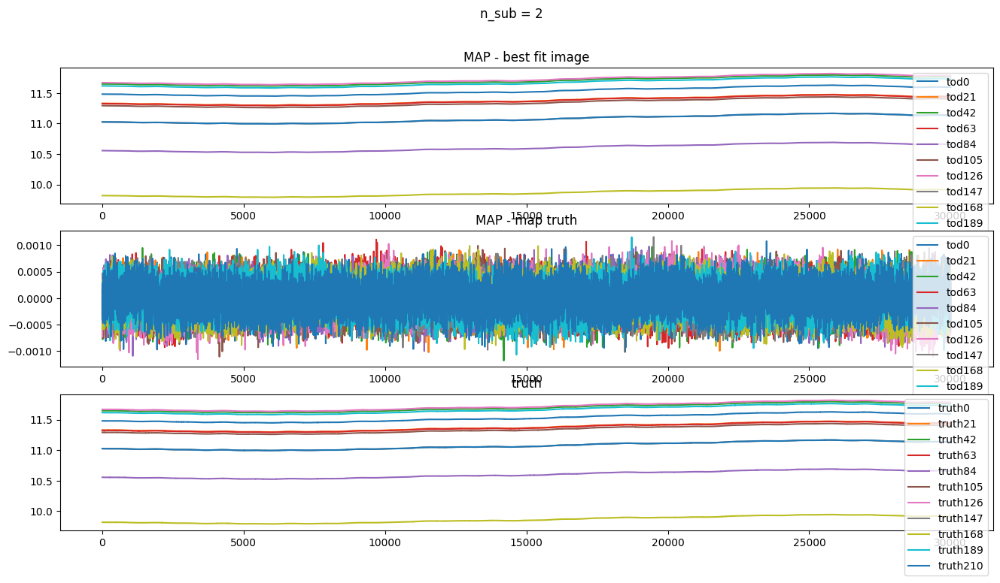

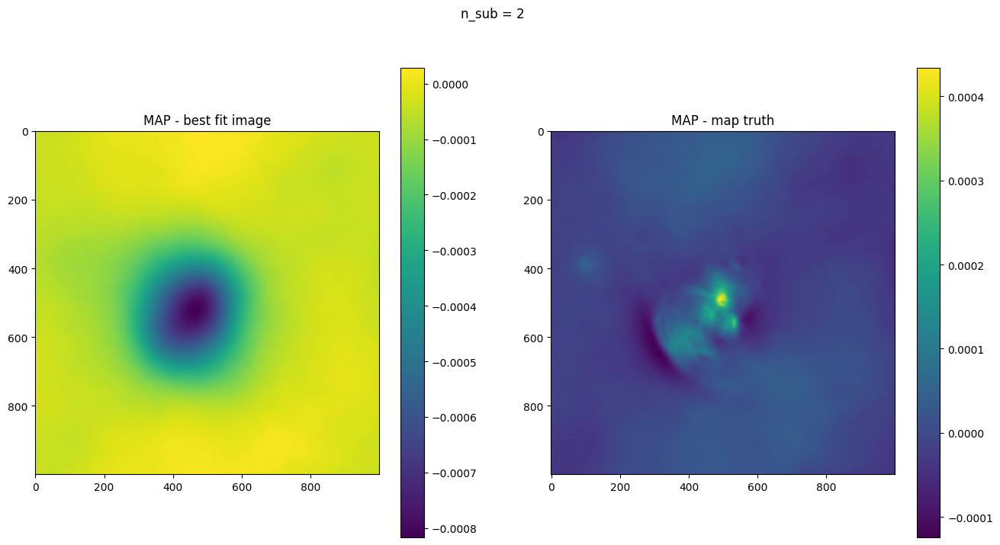

In [ ]:
fit.plotfitresults(samples)

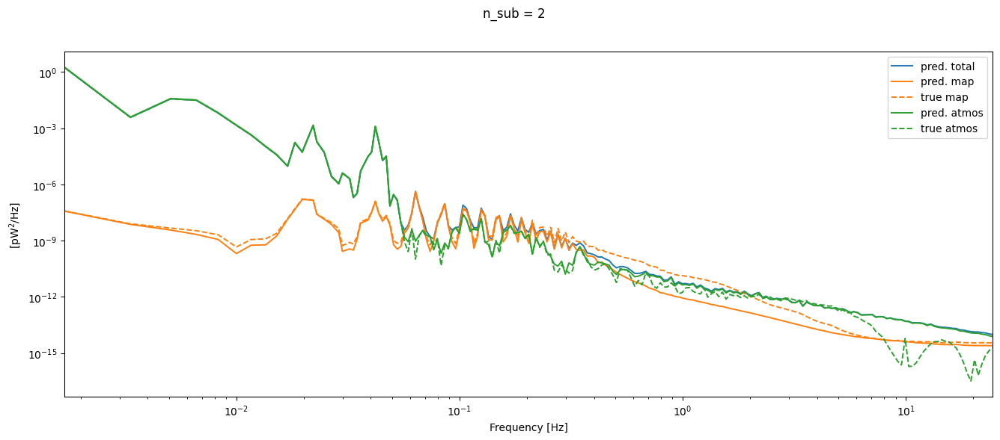

In [ ]:
fit.plotpowerspectrum(samples)

# Four GPs with halved x-dir

In [ ]:
fit.init_gps(n_sub=4, samples=samples)

(2, 217)
Will initialise GPs for atmosphere in 4 parts based on samples.
Initialised gp_tod: Model(
	<function CFM.finalize.<locals>.correlated_field at 0x151ec1992fc0>,
	domain={'combcf tod fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf tod loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf xi': ShapeWithDtype(shape=(4, 40000), dtype=<class 'jax.numpy.float64'>),
	 'combcf zeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)},
	init=Initializer(
		{'combcf tod fluctuations': functools.partial(<function random_like at 0x1524fafc2340>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'combcf tod loglogavgslope': functools.partial(<function random_like at 0x1524fafc2340>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'combcf xi': functools.partial(<function random_like at 0x1524fafc2340>, primals=ShapeWithDtype(shape=(4, 40000), dtype=<class 'ja

assuming a diagonal covariance matrix;
setting `std_inv` to `cov_inv(ones_like(data))**0.5`


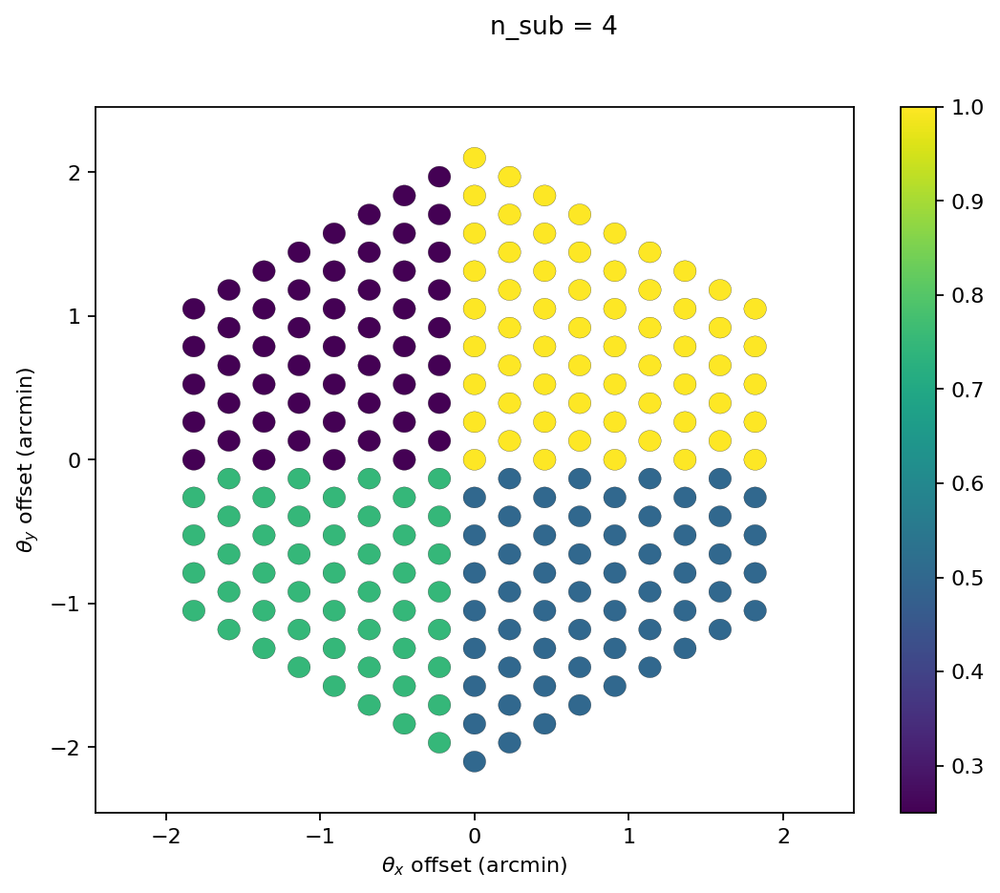

In [ ]:
fit.plot_subdets()

(217, 30000)


Array([[11.53126684, 11.53126076, 11.53125542, ..., 11.53009513,
        11.53009111, 11.53008518],
       [11.40281893, 11.40281795, 11.40281818, ..., 11.40583765,
        11.40583615, 11.40583346],
       [10.02550518, 10.02550192, 10.02549912, ..., 10.02448286,
        10.0244811 , 10.02447883],
       ...,
       [10.76945724, 10.76946119, 10.76946476, ..., 10.77070825,
        10.77070981, 10.77071295],
       [10.86158437, 10.86158775, 10.86159052, ..., 10.86273378,
        10.86273527, 10.86273764],
       [11.32333673, 11.32333491, 11.32333595, ..., 11.32415358,
        11.32415582, 11.32415741]], dtype=float64)

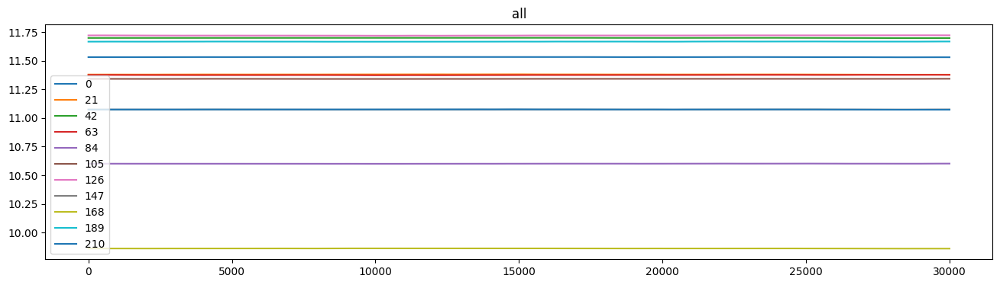

In [ ]:
fit.draw_prior_sample()

In [ ]:
samples, state = fit.perform_fit(n_it=2, printevery=4)

OPTIMIZE_KL: Starting 0001
SL: Iteration 0 ⛰:+3.3618e+09 Δ⛰:inf ➽:1.1801e+01
SL: Iteration 1 ⛰:+1.8356e+08 Δ⛰:3.1782e+09 ➽:1.1801e+01
SL: Iteration 2 ⛰:+5.6228e+07 Δ⛰:1.2734e+08 ➽:1.1801e+01
SL: Iteration 3 ⛰:+3.6775e+07 Δ⛰:1.9453e+07 ➽:1.1801e+01
SL: Iteration 4 ⛰:+2.0506e+07 Δ⛰:1.6269e+07 ➽:1.1801e+01
SL: Iteration 5 ⛰:+1.4351e+07 Δ⛰:6.1545e+06 ➽:1.1801e+01
SL: Iteration 6 ⛰:+1.2953e+07 Δ⛰:1.3979e+06 ➽:1.1801e+01
SL: Iteration 7 ⛰:+8.4383e+06 Δ⛰:4.5148e+06 ➽:1.1801e+01
SL: Iteration 8 ⛰:+8.1014e+06 Δ⛰:3.3692e+05 ➽:1.1801e+01
SL: Iteration 9 ⛰:+7.0047e+06 Δ⛰:1.0967e+06 ➽:1.1801e+01
SL: Iteration 10 ⛰:+5.7982e+06 Δ⛰:1.2066e+06 ➽:1.1801e+01
SL: Iteration 11 ⛰:+5.1034e+06 Δ⛰:6.9475e+05 ➽:1.1801e+01
SL: Iteration 12 ⛰:+4.4205e+06 Δ⛰:6.8296e+05 ➽:1.1801e+01
SL: Iteration 13 ⛰:+3.8134e+06 Δ⛰:6.0701e+05 ➽:1.1801e+01
SL: Iteration 14 ⛰:+3.6144e+06 Δ⛰:1.9904e+05 ➽:1.1801e+01
SL: Iteration 15 ⛰:+3.4677e+06 Δ⛰:1.4675e+05 ➽:1.1801e+01
SL: Iteration 16 ⛰:+3.1979e+06 Δ⛰:2.6973e+05 ➽:1.1801e+01
SL: 

In [ ]:
fit.printfitresults(samples)

Fit Results (res, init, std) for n_sub = 4

TODs:
	fluctuations: 0.0013821196512305116, 0.0015, 0.0001
	loglogvarslope: -2.1176314296152183, -2.45, 0.1
	zeromode std (LogNormal): 3.5079941134657307e-06, 1e-05, 9.9e-06
map:
	fluctuations: 5.608256547859123e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.883000735310343, -2.5, 0.1
	zeromode std (LogNormal): 9.112533987259576e-10, 1e-08, 1e-07


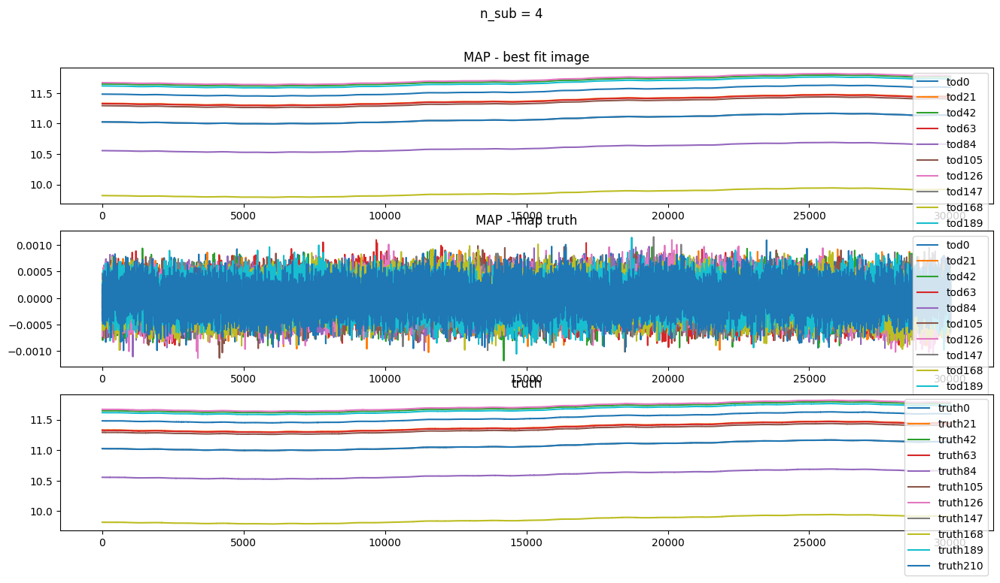

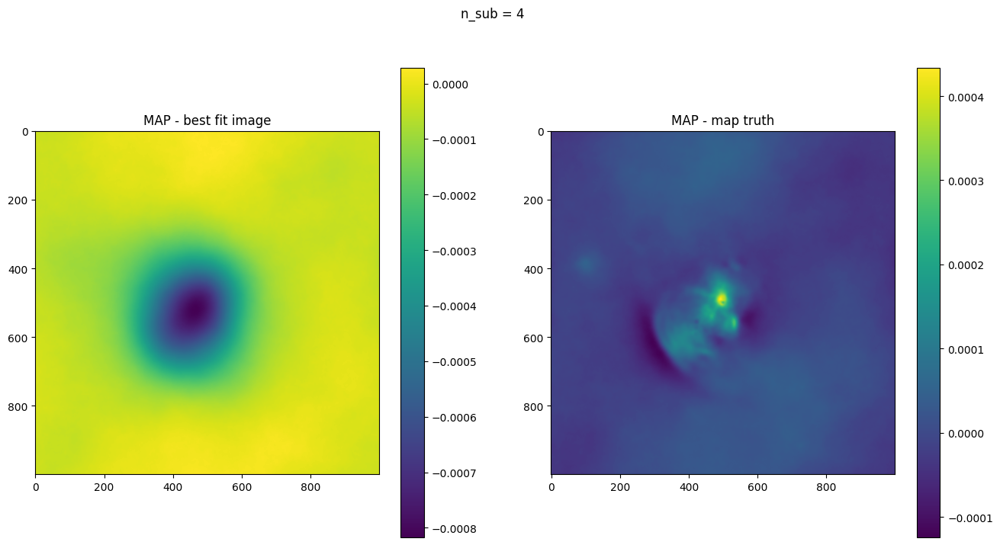

In [ ]:
fit.plotfitresults(samples)

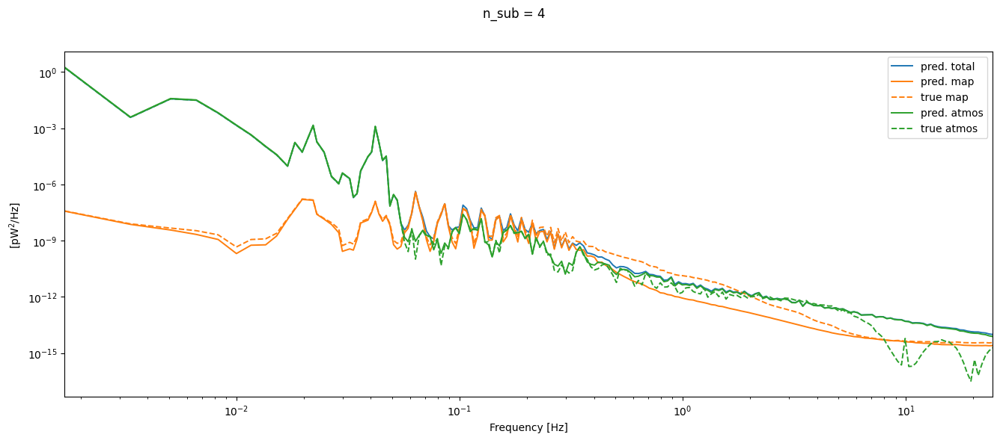

In [ ]:
fit.plotpowerspectrum(samples)

# All dets.

In [ ]:
fit.init_gps(n_sub=-1, samples=samples)

(2, 217)
Will initialise GPs for atmosphere in -1 parts based on samples.


assuming a diagonal covariance matrix;
setting `std_inv` to `cov_inv(ones_like(data))**0.5`


Initialised gp_tod: Model(
	<function CFM.finalize.<locals>.correlated_field at 0x151c8045df80>,
	domain={'combcf tod fluctuations': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf tod loglogavgslope': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>),
	 'combcf xi': ShapeWithDtype(shape=(217, 40000), dtype=<class 'jax.numpy.float64'>),
	 'combcf zeromode': ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)},
	init=Initializer(
		{'combcf tod fluctuations': functools.partial(<function random_like at 0x1524fafc2340>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'combcf tod loglogavgslope': functools.partial(<function random_like at 0x1524fafc2340>, primals=ShapeWithDtype(shape=(), dtype=<class 'jax.numpy.float64'>)),
		 'combcf xi': functools.partial(<function random_like at 0x1524fafc2340>, primals=ShapeWithDtype(shape=(217, 40000), dtype=<class 'jax.numpy.float64'>)),
		 'combcf zeromode': functools.partial(<functio

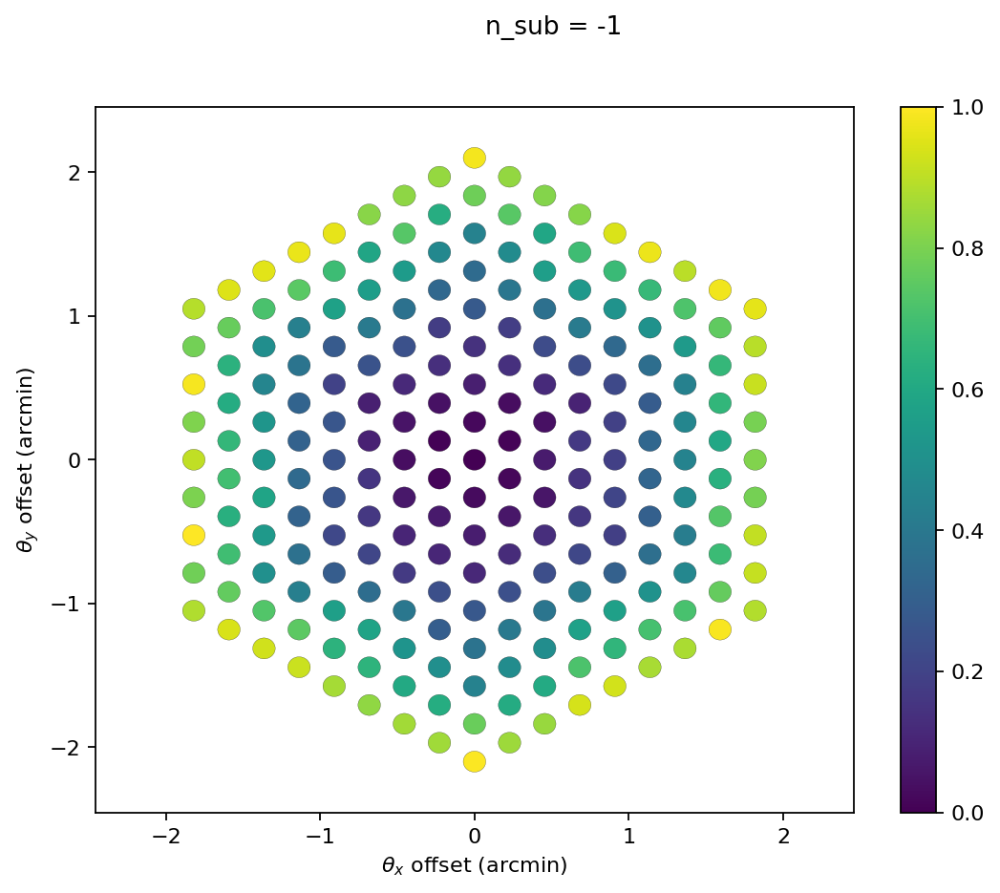

In [ ]:
fit.plot_subdets()

OPTIMIZE_KL: Starting 0001
SL: Iteration 0 ⛰:+2.4347e+08 Δ⛰:inf ➽:9.7001e+01
SL: Iteration 1 ⛰:+1.9018e+08 Δ⛰:5.3289e+07 ➽:9.7001e+01
SL: Iteration 2 ⛰:+1.5414e+08 Δ⛰:3.6043e+07 ➽:9.7001e+01
SL: Iteration 3 ⛰:+4.1944e+07 Δ⛰:1.1220e+08 ➽:9.7001e+01
SL: Iteration 4 ⛰:+2.7053e+07 Δ⛰:1.4890e+07 ➽:9.7001e+01
SL: Iteration 5 ⛰:+1.5700e+07 Δ⛰:1.1353e+07 ➽:9.7001e+01
SL: Iteration 6 ⛰:+1.5696e+07 Δ⛰:4.2476e+03 ➽:9.7001e+01
SL: Iteration 7 ⛰:+1.1428e+07 Δ⛰:4.2679e+06 ➽:9.7001e+01
SL: Iteration 8 ⛰:+8.9858e+06 Δ⛰:2.4423e+06 ➽:9.7001e+01
SL: Iteration 9 ⛰:+5.4818e+06 Δ⛰:3.5040e+06 ➽:9.7001e+01
SL: Iteration 10 ⛰:+4.9678e+06 Δ⛰:5.1396e+05 ➽:9.7001e+01
SL: Iteration 11 ⛰:+4.9288e+06 Δ⛰:3.9000e+04 ➽:9.7001e+01
SL: Iteration 12 ⛰:+4.2480e+06 Δ⛰:6.8084e+05 ➽:9.7001e+01
SL: Iteration 13 ⛰:+3.4529e+06 Δ⛰:7.9506e+05 ➽:9.7001e+01
SL: Iteration 14 ⛰:+2.3203e+06 Δ⛰:1.1326e+06 ➽:9.7001e+01
SL: Iteration 15 ⛰:+1.7300e+06 Δ⛰:5.9035e+05 ➽:9.7001e+01
SL: Iteration 16 ⛰:+1.7298e+06 Δ⛰:1.5971e+02 ➽:9.7001e+01
SL: 

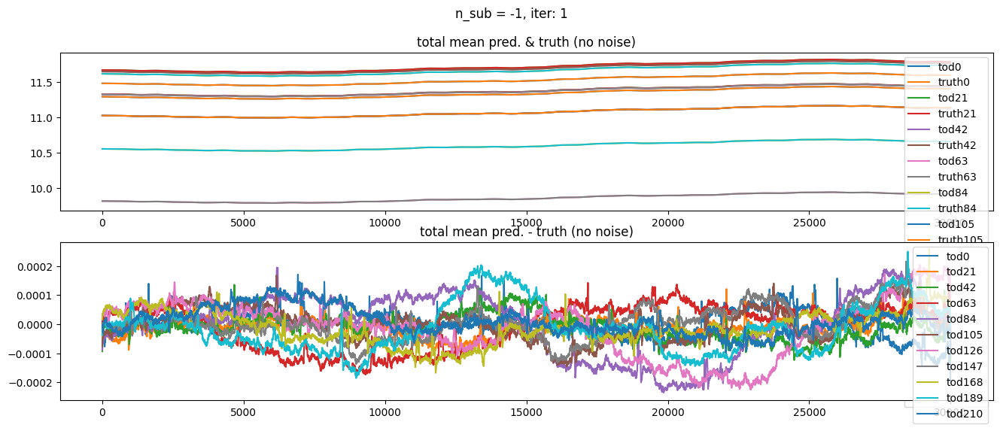

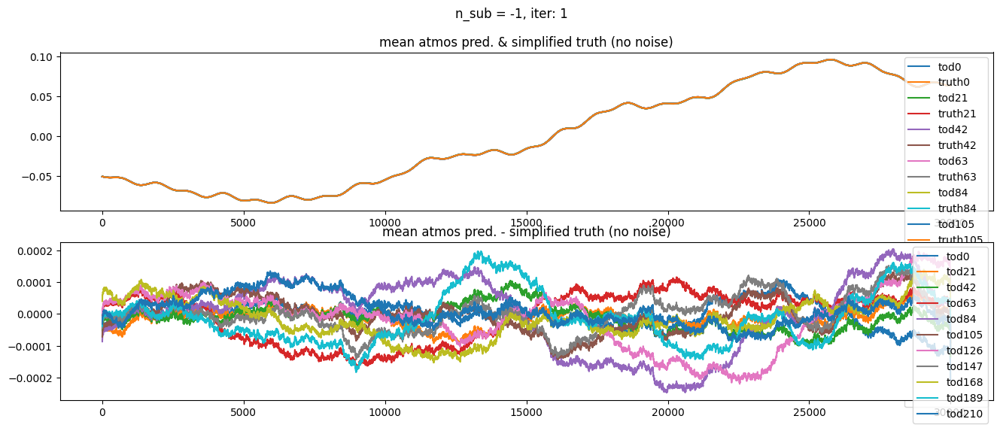

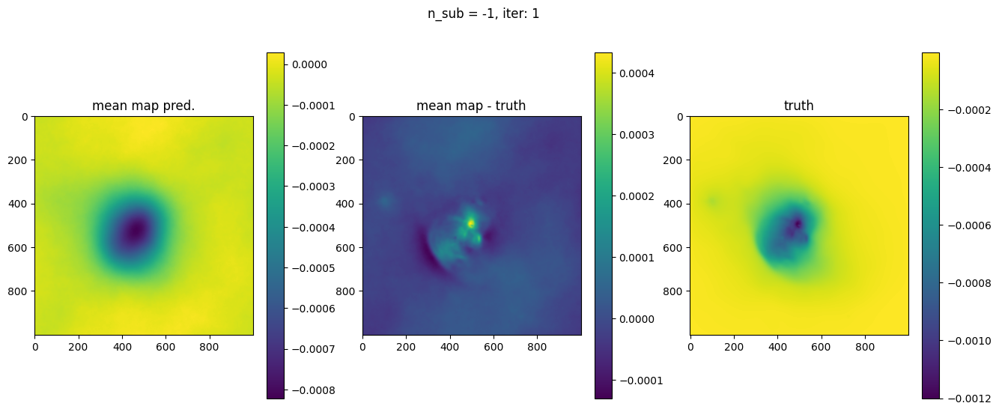

OPTIMIZE_KL: Starting 0002
SL: Iteration 0 ⛰:+4.7474e+08 Δ⛰:inf ➽:9.7001e+01
SL: Iteration 1 ⛰:+1.7654e+08 Δ⛰:2.9820e+08 ➽:9.7001e+01
SL: Iteration 2 ⛰:+1.6565e+08 Δ⛰:1.0890e+07 ➽:9.7001e+01
SL: Iteration 3 ⛰:+4.3187e+07 Δ⛰:1.2246e+08 ➽:9.7001e+01
SL: Iteration 4 ⛰:+2.7489e+07 Δ⛰:1.5698e+07 ➽:9.7001e+01
SL: Iteration 5 ⛰:+1.5637e+07 Δ⛰:1.1852e+07 ➽:9.7001e+01
SL: Iteration 6 ⛰:+1.5633e+07 Δ⛰:4.6773e+03 ➽:9.7001e+01
SL: Iteration 7 ⛰:+1.1329e+07 Δ⛰:4.3041e+06 ➽:9.7001e+01
SL: Iteration 8 ⛰:+9.0484e+06 Δ⛰:2.2802e+06 ➽:9.7001e+01
SL: Iteration 9 ⛰:+5.6876e+06 Δ⛰:3.3608e+06 ➽:9.7001e+01
SL: Iteration 10 ⛰:+5.6447e+06 Δ⛰:4.2948e+04 ➽:9.7001e+01
SL: Iteration 11 ⛰:+5.6376e+06 Δ⛰:7.0899e+03 ➽:9.7001e+01
SL: Iteration 12 ⛰:+4.4606e+06 Δ⛰:1.1770e+06 ➽:9.7001e+01
SL: Iteration 13 ⛰:+3.6716e+06 Δ⛰:7.8892e+05 ➽:9.7001e+01
SL: Iteration 14 ⛰:+2.5538e+06 Δ⛰:1.1178e+06 ➽:9.7001e+01
SL: Iteration 15 ⛰:+1.9173e+06 Δ⛰:6.3651e+05 ➽:9.7001e+01
SL: Iteration 16 ⛰:+1.9170e+06 Δ⛰:3.2347e+02 ➽:9.7001e+01
SL: 

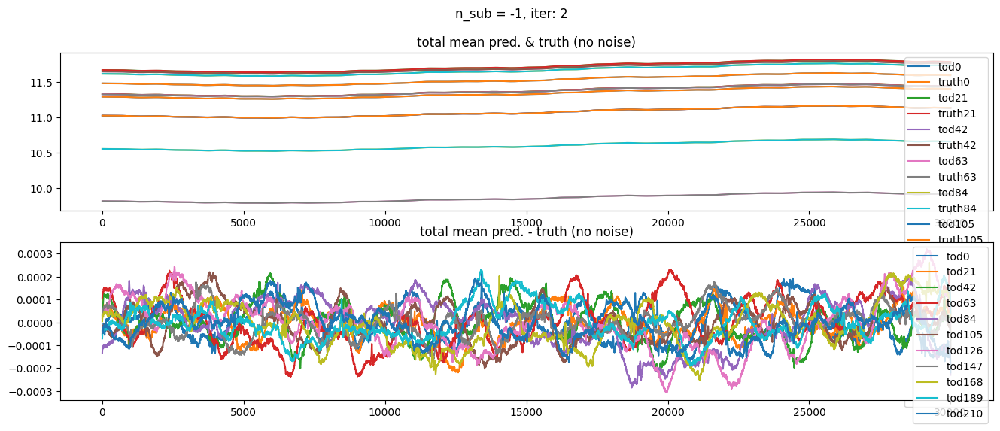

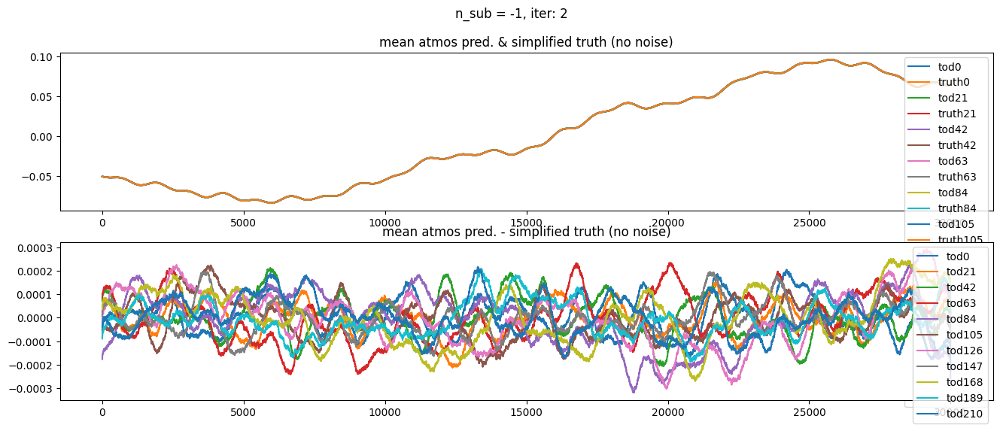

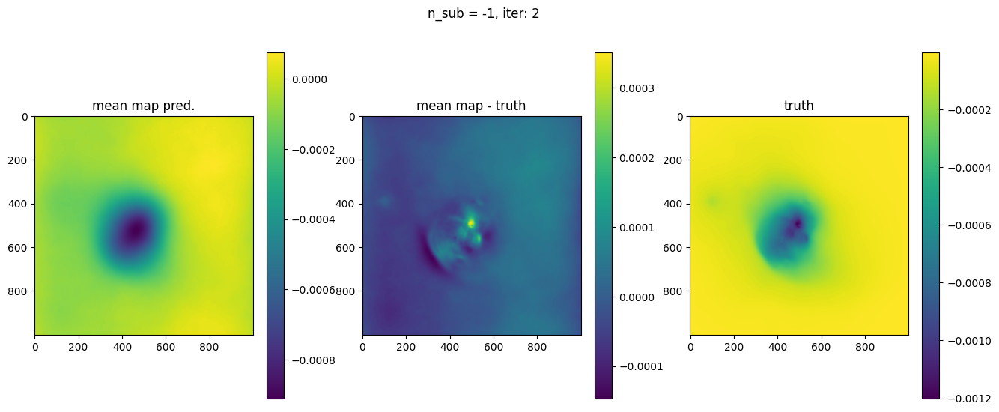

In [ ]:
samples, state = fit.perform_fit(n_it=2, printevery=1)

In [ ]:
fit.printfitresults(samples)

Fit Results (res, init, std) for n_sub = -1

TODs:
	fluctuations: 0.0013837640962032181, 0.0015, 0.0001
	loglogvarslope: -2.128093463009084, -2.45, 0.1
	zeromode std (LogNormal): 2.320289476415133e-06, 1e-05, 9.9e-06
map:
	fluctuations: 5.627551012068634e-05, 5.6e-05, 1e-06
	loglogvarslope: -2.9360745153995214, -2.5, 0.1
	zeromode std (LogNormal): 9.09597746715277e-10, 1e-08, 1e-07


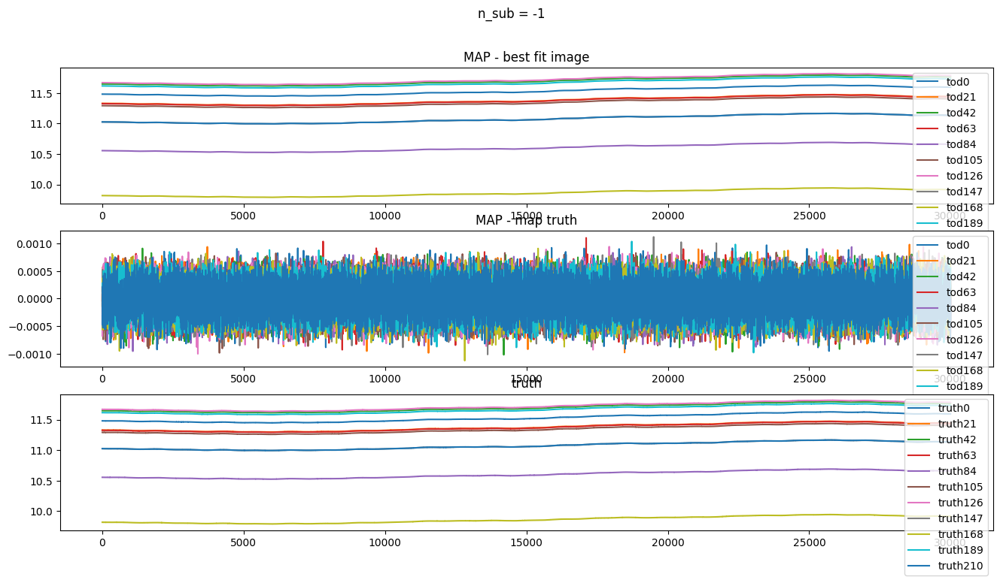

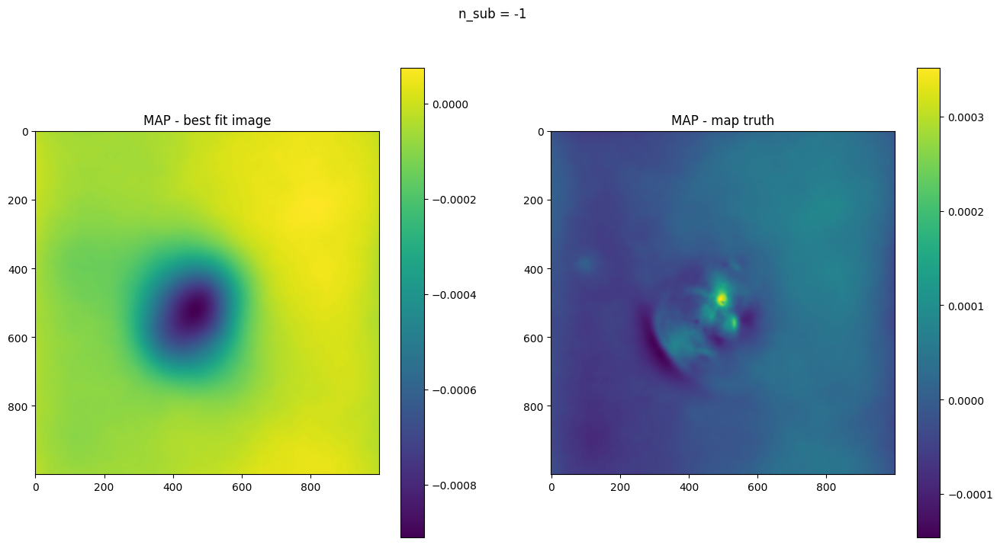

In [ ]:
fit.plotfitresults(samples)

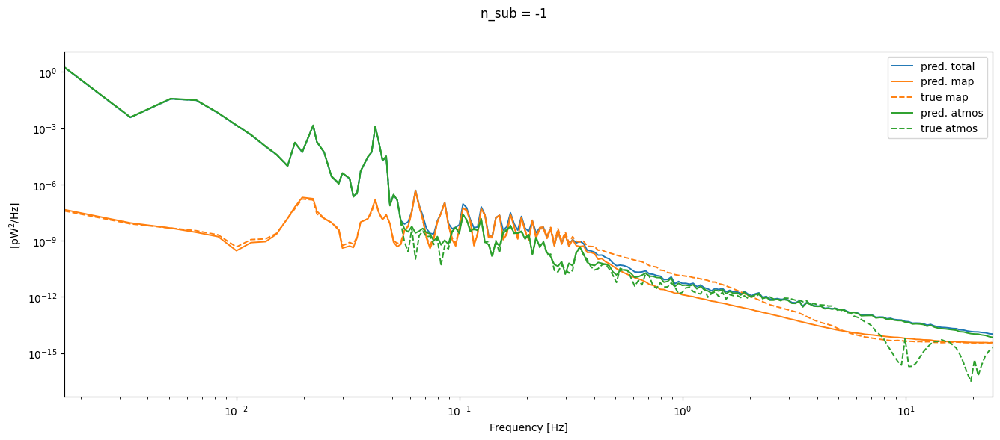

In [ ]:
fit.plotpowerspectrum(samples)

In [ ]:
fit.make_atmosphere_det_gif(samples, figname='test.gif', tmax=2500)

Making plot 0 out of 2500.
Making plot 25 out of 2500.
Making plot 50 out of 2500.
Making plot 75 out of 2500.
Making plot 100 out of 2500.
Making plot 125 out of 2500.
Making plot 150 out of 2500.
Making plot 175 out of 2500.
Making plot 200 out of 2500.
Making plot 225 out of 2500.
Making plot 250 out of 2500.
Making plot 275 out of 2500.
Making plot 300 out of 2500.
Making plot 325 out of 2500.
Making plot 350 out of 2500.
Making plot 375 out of 2500.
Making plot 400 out of 2500.
Making plot 425 out of 2500.
Making plot 450 out of 2500.
Making plot 475 out of 2500.
Making plot 500 out of 2500.
Making plot 525 out of 2500.
Making plot 550 out of 2500.
Making plot 575 out of 2500.
Making plot 600 out of 2500.
Making plot 625 out of 2500.
Making plot 650 out of 2500.
Making plot 675 out of 2500.
Making plot 700 out of 2500.
Making plot 725 out of 2500.
Making plot 750 out of 2500.
Making plot 775 out of 2500.
Making plot 800 out of 2500.
Making plot 825 out of 2500.
Making plot 850 out

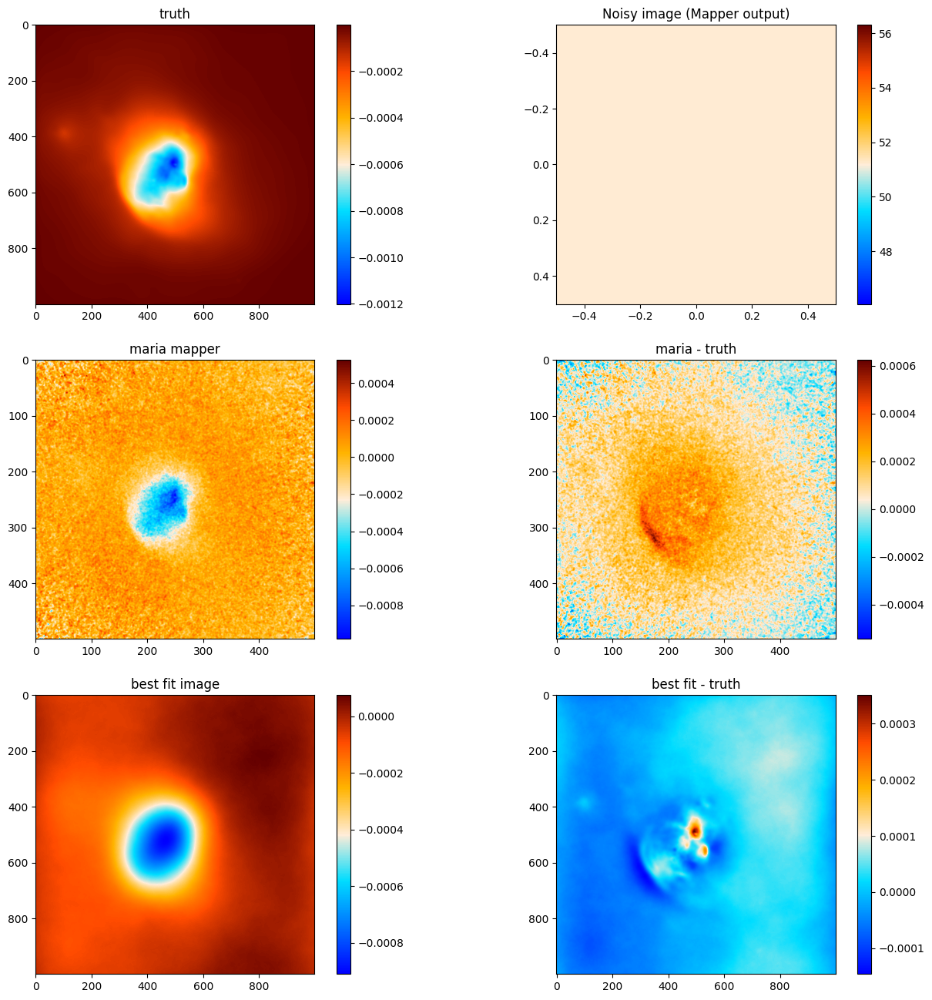

In [ ]:
fit.plotrecos(samples)